### Packages to run the notebook

In [1]:
#files needed to run the processing. NB utils is a custom package, others are available via pip install
import utils

import skimage
import napari
import numpy as np
import matplotlib.pyplot as plt
import PIL
from PIL import Image, ImageDraw

from skimage import data, img_as_float, img_as_ubyte, exposure
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage.metrics import peak_signal_noise_ratio
from skimage.util import random_noise

from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import os
import tifffile as tif

import ipywidgets as widgets

from skimage.registration import phase_cross_correlation
from skimage.registration._phase_cross_correlation import _upsampled_dft

import pyvista as pv
from mpl_toolkits.mplot3d.art3d import Poly3DCollection



### Functions for image segmentation

In [ ]:
z_widget = widgets.IntSlider(
    value=2,
    min=0,
    max=199,
    step=1,
)




def view_slice_image(img: np.ndarray, z: int) -> None:
    depth, h, w = img.shape
    assert isinstance(img, np.ndarray)
    assert isinstance(z, int)
    assert 0 <= z < depth

    slice = img[:, :, z]
    fig = plt.figure(figsize=(6, 6))
    plt.imshow(slice, cmap='gray', vmin=0, vmax=255)
    plt.show()

#other potential algorithms that were tested. The fast algorithm did a good job and runs much quicker. Best to use the value calculated from the image itself 
'''
# slow algorithm, sigma provided by user
denoise = denoise_nl_means(dry_float, h=1.2 * sigma, fast_mode=False,
                           **patch_kw)

# slow algorithm
denoise2 = denoise_nl_means(dry_float, h=1.2 * sigma_est, sigma=sigma_est,
                            fast_mode=False, **patch_kw)


# fast algorithm, sigma provided by user 
denoise_fast = denoise_nl_means(dry_float, h=1.2 * sigma, fast_mode=True,
                                **patch_kw)
'''

def nlm_denoise(Img,patch,dist):
    
    def nlm_denoise_wrap(array):
        correct=img_as_float(array[0])
        sigma_est = np.mean(estimate_sigma(correct))
        correct = denoise_nl_means(correct, h= 1.8*sigma_est, sigma=sigma_est,fast_mode=True,patch_size=patch, patch_distance=dist)
        return correct[np.newaxis, ...]
    
    denoise=skimage.util.apply_parallel(nlm_denoise_wrap,Img, chunks=(1, Img.shape[1],Img.shape[2]), dtype='float',compute=True)
    
    return  denoise

def phase_segmentation_adapted_watershed(im, pore_thresh, grain_thresh_leeway):

    """
    Performs watershed segmentation on the greyscale image 
    
    Parameters
    ----------
    im : 3D array
        Image to be segmented. 
    
    grain_thresh: float
        Threshold above which grains exist. 
    pore_thresh: float 
        Threshold below which pores exist. 
    
    Output
    -------
    final_seg: segmented image 
    """
    
    # Make sure that the input image is between 0 and 1 
    if np.max(im) != 1.0:
        im = (im - im.min()) / (im.max() - im.min())

    im = im.astype(np.float32)
    #plot histogram with limits of what is pore and what is grain shown
    fig, ax = plt.subplots(figsize =(10, 7))
    hist_values = im.ravel()
    hist_values = hist_values[hist_values < 0.99]
    y, x, _ = plt.hist(hist_values, bins=bins, histtype='step', color='red')


    # Normal distribution to get the max threshold 
    loc         =  np.argmax(y)                             #find peak 
    update_list = hist_values[hist_values > x[loc]]
    update_y, update_x, _ = plt.hist(update_list, bins=bins, histtype='step', color='red')
    loc2                  =  np.argmax(update_y[update_y< (0.0001 * y.max())])

    grain_thresh = (x[loc] - (update_x[loc2] - x[loc])) *grain_thresh_leeway 
    plt.axvline(grain_thresh, color='r', linestyle='dashed', linewidth=1)
    plt.axvline(pore_thresh, color='k', linestyle='dashed', linewidth=1)
    plt.show()

    # Generate the catchment basins for watershed
    print('Making the catchment basin')
    basins = np.zeros_like(im)
    basins[im < grain_thresh] = 1
    basins[im > pore_thresh] = 2
    basins = basins.astype(np.float32)

    # Peform the watershed by flooding. 
    print('Flood the basin')
    flood_seg = skimage.segmentation.watershed(im , basins)
    flood_seg = flood_seg > 1.0

    # Compute the distance matrix
    print('Compute the distance matrix')
    distances = ndi.distance_transform_edt(flood_seg)
    
    #Find the maxima NB this is taking a while on 3D images 
    print('Find the maxima')
    local_max = skimage.morphology.local_maxima(distances)
    max_lab = skimage.measure.label(local_max)

    #Perform the topological watershed. 
    print('Perform the topological watershed')
    final_seg = skimage.segmentation.watershed(-distances, max_lab, mask=flood_seg)

    # Remove any stray crap. 
    final_seg = skimage.morphology.remove_small_objects(final_seg, min_size=4)

    #Normalise final_seg 
    final_seg = (final_seg - final_seg.min()) / (final_seg.max() - final_seg.min()) * 255
    # Subresolvable pores - large regions in the middle zone 
    sub_resolvable = utils.simple_thresholding(im, pore_thresh*0.95, grain_thresh*1.15)
    sub_resolvable = skimage.morphology.remove_small_objects(sub_resolvable, min_size=10)   
    print('Grain threshold is', grain_thresh)
    return np.array(final_seg, dtype=np.uint8), np.array(sub_resolvable, dtype=np.uint8)


overlay_widget = widgets.RadioButtons(
    options=[True, False],
    description='Overlay:',
    disabled=False,
)


def view_slice(img: np.ndarray, z: int, overlay: bool, mask: bool) -> None:
    depth, h, w = img.shape
    assert isinstance(img, np.ndarray)
    assert isinstance(z, int)
    assert isinstance(overlay, bool)
    assert 0 <= z < depth

    slice = img[:, :, z]

    if overlay:
        slice = utils.preprocess(slice)
        mask  = mask[:, :, z]
        slice = utils.sanity_check(slice, mask)
    
    fig = plt.figure(figsize=(6, 6))
    plt.imshow(slice, cmap='gray', vmin=np.min(slice), vmax=np.max(slice))
    plt.show()

def seg_analysis(seg_gas, connect_value):
    labeled_gas = skimage.measure.label(seg_gas==0, connectivity= connect_value)


    num_objects   = np.max(labeled_gas)
    print(num_objects)



    values = labeled_gas
    grid = pv.ImageData()
    grid.dimensions = np.array(values.shape) + 1
    grid.cell_data["No. Ganglia"] = values.flatten(order="F")

    
    thresholded_grid = grid.threshold(0.1)
    p = pv.Plotter()
    p.add_mesh(thresholded_grid, opacity=1, cmap="rainbow", scalar_bar_args={'vertical': True})
    p.show()
    return num_objects

def QC_filter(denoise2_fast, dry_data):

    #note we want the most filtered image that doesn't compromise the boundaries. 
    diff_img = denoise2_fast- dry_data

    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 20),
                        sharex=True, sharey=True)

    ax[0].imshow(diff_img[15,:, :],cmap='gray')
    ax[0].axis('off')


    ax[1].imshow(dry_data[15,:, :],cmap='gray')
    ax[1].axis('off')

    ax[2].imshow(denoise2_fast[15,: :],cmap='gray')
    ax[2].axis('off')

    fig.tight_layout()
    plt.show()

    #plot of the histograms (entire image, not the zoomed in image)
    bins=255
    plt.rcParams.update({'font.size': 14})
    fig, ax = plt.subplots(figsize =(7, 5))
    ax.set_xlabel('Greyscale value')
    ax.set_ylabel('Count')

    ax.set_xlim(0, 120) 
    ax.set_ylim(0, 0.1*10**7) 

    ax.hist(dry_data.ravel(), bins=bins, histtype='step', color='black')
    ax.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))

    ax.hist(utils.preprocess(denoise2_fast).ravel(), bins=bins, histtype='step', color='red')
    ax.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax.legend(['raw data', 'filtered data'])
    fig.tight_layout()
    plt.show()

### Load in the dry scan 

In [4]:
dry_data  = skimage.io.imread('dry_bin2.tif')

widgets.interact(view_slice_image, img=widgets.fixed(dry_data[:,:,:]), z=z_widget)

interactive(children=(IntSlider(value=2, description='z', max=199), Output()), _dom_classes=('widget-interact'…

<function __main__.view_slice_image(img: numpy.ndarray, z: int) -> None>

### Non-local means in 3D 

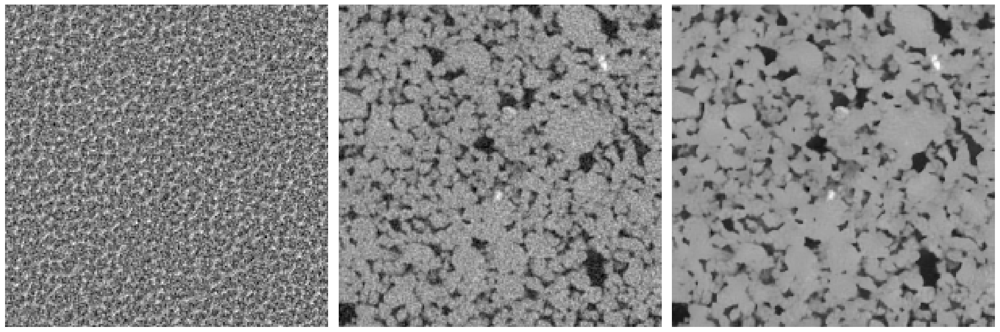

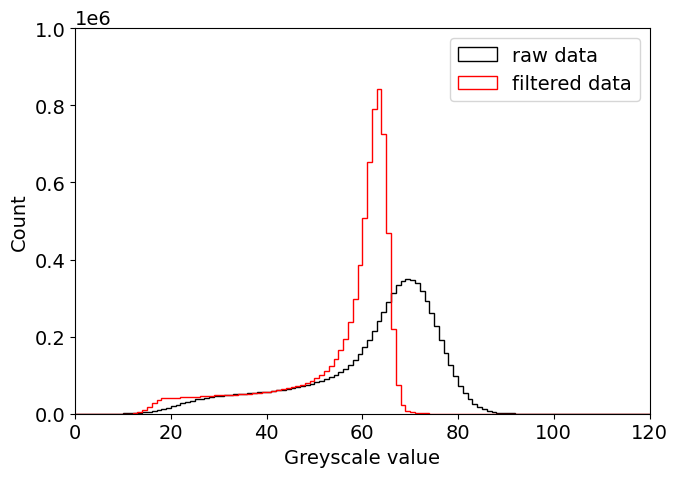

In [12]:
#non-local means filter works better on float of image with no exposure or histogram modification.

dry_float = dry_data.astype(np.float32)
denoise2_fast = nlm_denoise(dry_float, patch = 3,  dist = 4)

QC_filter(denoise2_fast, dry_data)


### Segmentation of pore space

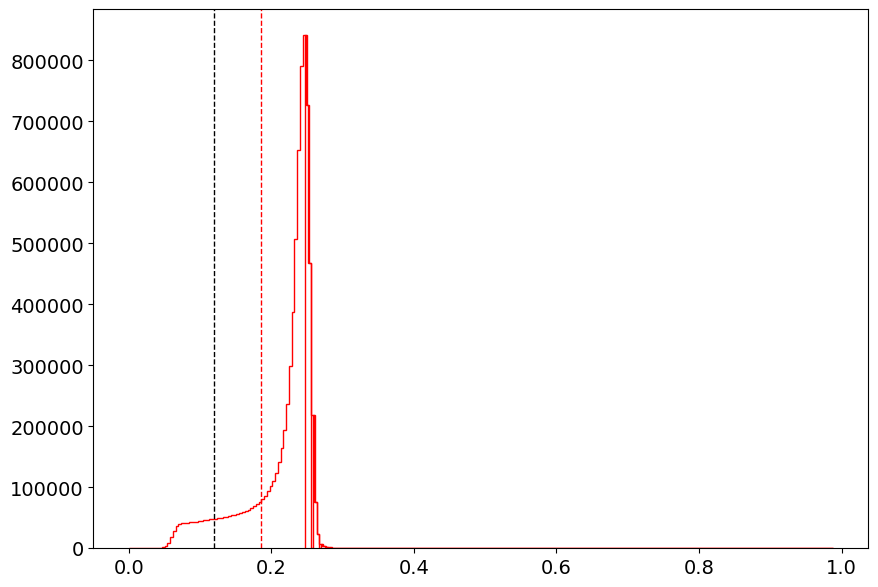

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18602076172828674


In [13]:

# can delete the unfiltered data to save memory for the segmentation if needed

#perform the segmentation 

input_segmentation                   = img_as_ubyte(utils.preprocess(denoise2_fast.transpose(1,2,0))) #must transpose the image for the input to be xyz, previously zxy
segmented_img, sub_resolved_pores    = phase_segmentation_adapted_watershed(input_segmentation, pore_thresh=0.12, grain_thresh_leeway=1)

#NB the histogram is normalised for the segmentation. Currently the mask values are included in this, so if you do a subvolume, then the threshold values need to change. 





### Viewing the segmented data 

In [ ]:
#convert to binary and check the segmentation 
segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool_)
segmented_binary_subpore     = np.where(sub_resolved_pores>0, 1, sub_resolved_pores).astype(np.bool_)
greyscale_input              = (input_segmentation - input_segmentation.min()) / (input_segmentation.max() - input_segmentation.min()) * 255


seg_dry = utils.sanity_check(greyscale_input[:,:,3].astype(np.uint8), segmented_binary[:,:,3]==0, 0.2)
seg_dry_sub = utils.sanity_check(greyscale_input[:,:,3].astype(np.uint8), segmented_binary_subpore[:,:,3], 0.2)

widgets.interact(view_slice, img=widgets.fixed(greyscale_input[:,:,:]), z=z_widget, overlay=overlay_widget, mask = widgets.fixed(segmented_binary[:,:,:] ==0))

interactive(children=(IntSlider(value=2, description='z', max=199), RadioButtons(description='Overlay:', optio…

<function __main__.view_slice(img: numpy.ndarray, z: int, overlay: bool, mask: bool) -> None>

6477


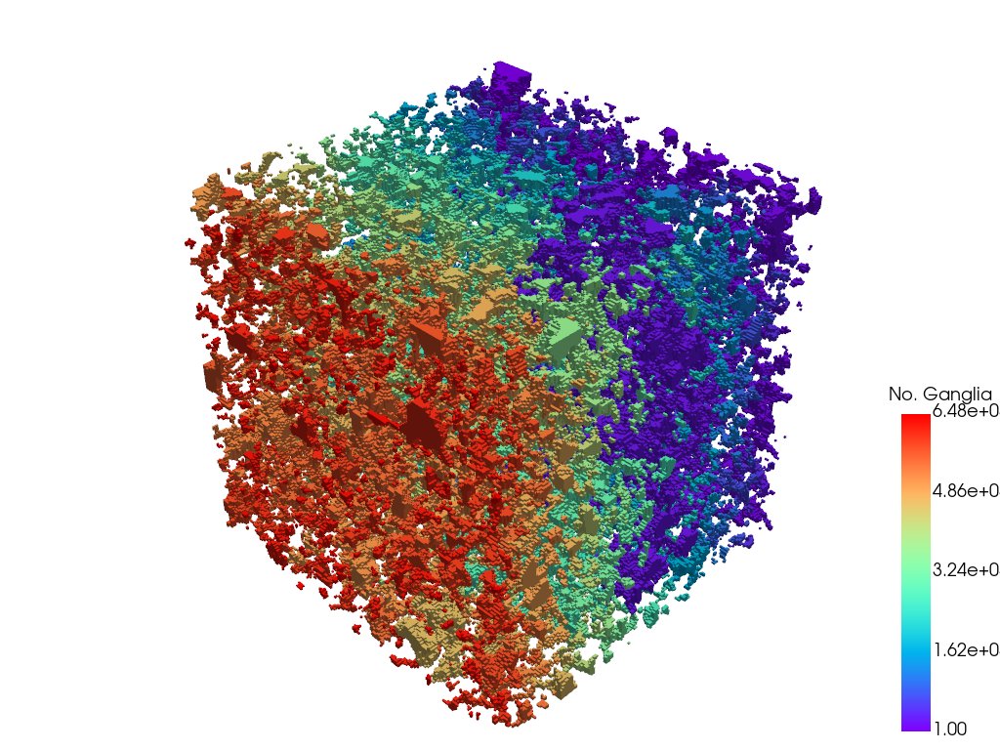

In [34]:

num_ganglia_pore = seg_analysis(segmented_binary, connect_value=3) 


### Sensitivity analysis for pore space

In [35]:

def multiple_runs(patch, dist, pore_thresh, grain_thresh_leeway):
    #Iterating over different filtering values 
    denoise2_fast = nlm_denoise(dry_float, patch = patch,  dist = dist)
    input_segmentation                   = img_as_ubyte(utils.preprocess(denoise2_fast.transpose(1,2,0))) #must transpose the image for the input to be xyz, previously zxy
    segmented_img, sub_resolved_pores    = phase_segmentation_adapted_watershed(input_segmentation, pore_thresh=pore_thresh, grain_thresh_leeway=grain_thresh_leeway)
    
    #convert to binary and check the segmentation 
    segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool_)
    greyscale_input              = (input_segmentation - input_segmentation.min()) / (input_segmentation.max() - input_segmentation.min()) * 255


    seg_dry = utils.sanity_check(greyscale_input[:,:,3].astype(np.uint8), segmented_binary[:,:,3]==0, 0.2)
    #plot of the histograms (entire image, not the zoomed in image)
    bins=255
    plt.rcParams.update({'font.size': 14})
    fig, ax = plt.subplots(figsize =(7, 5))
    ax.set_xlabel('Greyscale value')
    ax.set_ylabel('Count')

    ax.set_xlim(0, 120) 
    ax.set_ylim(0, 0.1*10**7) 

    ax.hist(dry_float.ravel(), bins=bins, histtype='step', color='black')
    ax.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))

    ax.hist(utils.preprocess(denoise2_fast).ravel(), bins=bins, histtype='step', color='red')
    ax.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax.legend(['raw data', 'filtered data'])
    fig.tight_layout()
    plt.show()


    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20),
                        sharex=True, sharey=True)

    ax[0].imshow(seg_dry,cmap='gray')
    ax[0].axis('off')
    ax[0].set_title('Segmented pore space')


    ax[1].imshow(greyscale_input[:,:,3],cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('original image')

    fig.tight_layout()
    plt.show()
    porosity = np.sum(segmented_binary==0)/ np.sum(segmented_binary==1)
    return porosity, segmented_binary

#### Varying the filtering process

6


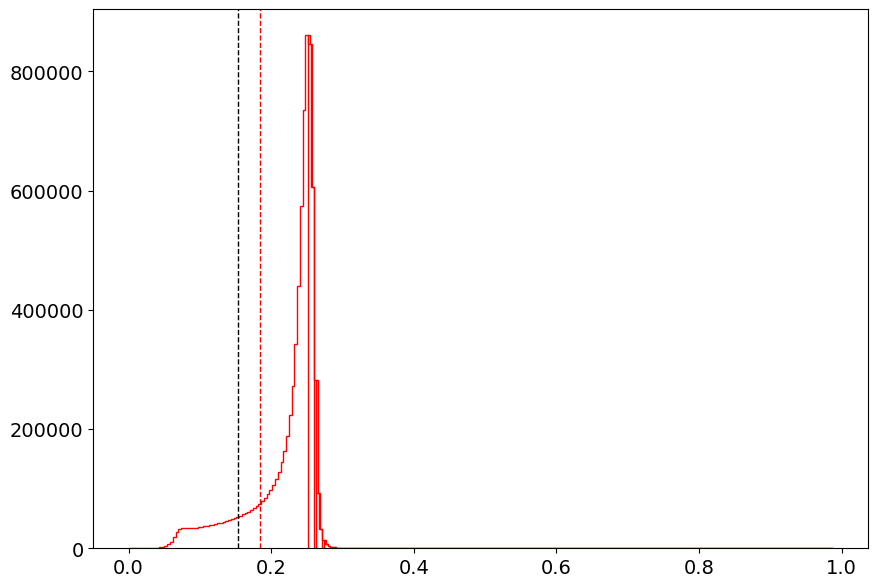

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.1837385579943657


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_79330/1551627886.py:8: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


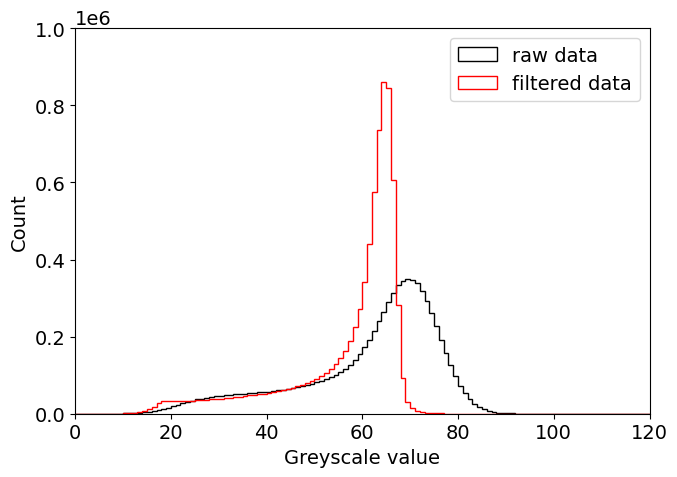

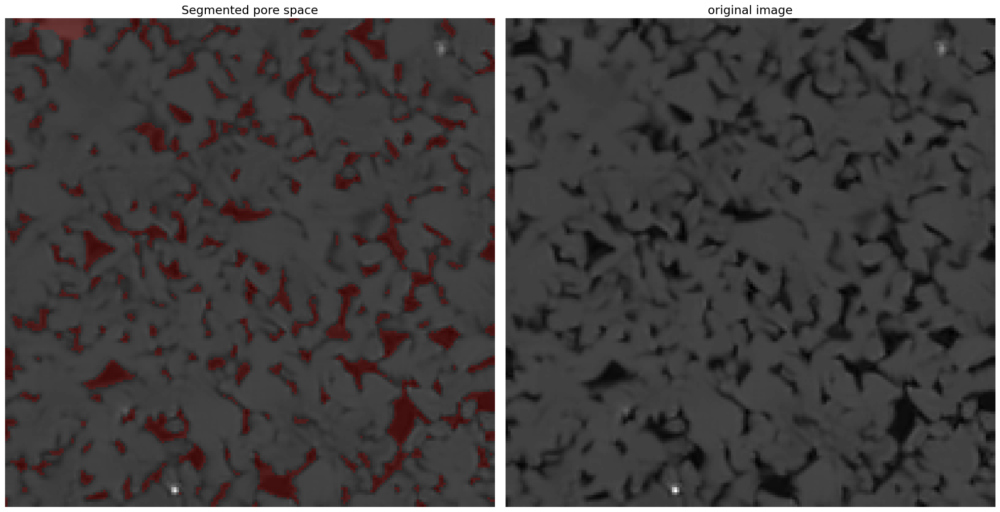

Text(0.5, 0, 'Patch size')

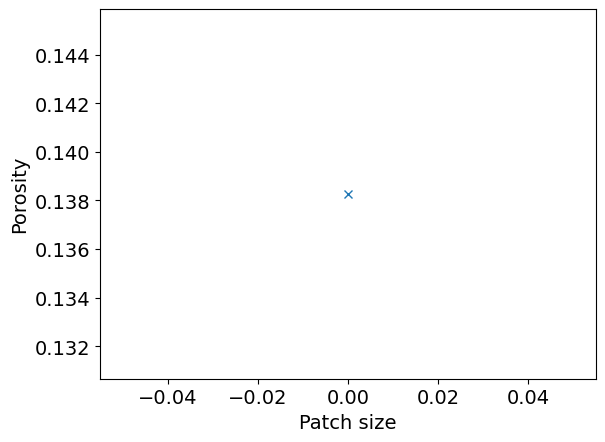

In [38]:
phi = []

for i in [6]:
    print(i)
    porosity, segmented_binary = multiple_runs(patch = i, dist = 6, pore_thresh=0.14+0.0134, grain_thresh_leeway=0.85)
    phi.append(porosity)

plt.plot(phi, 'x')
plt.ylabel('Porosity')
plt.xlabel('Patch size')
#work out the run time for each section 


#### Varying the pore threshold values

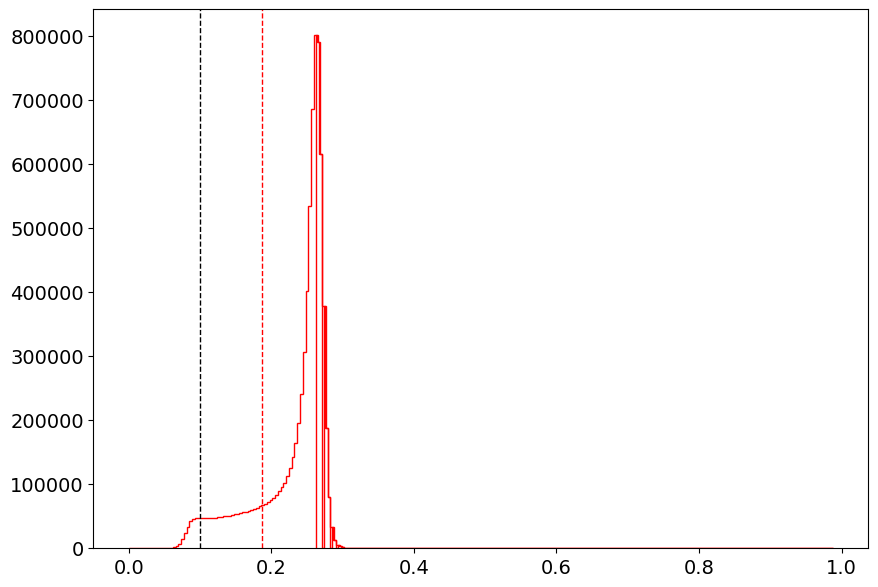

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


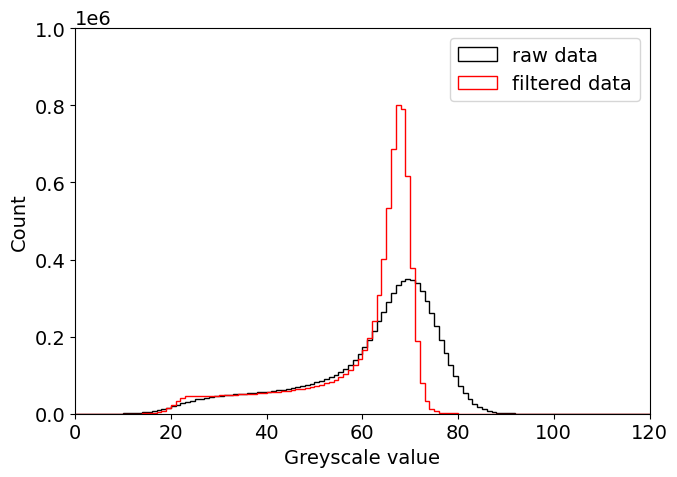

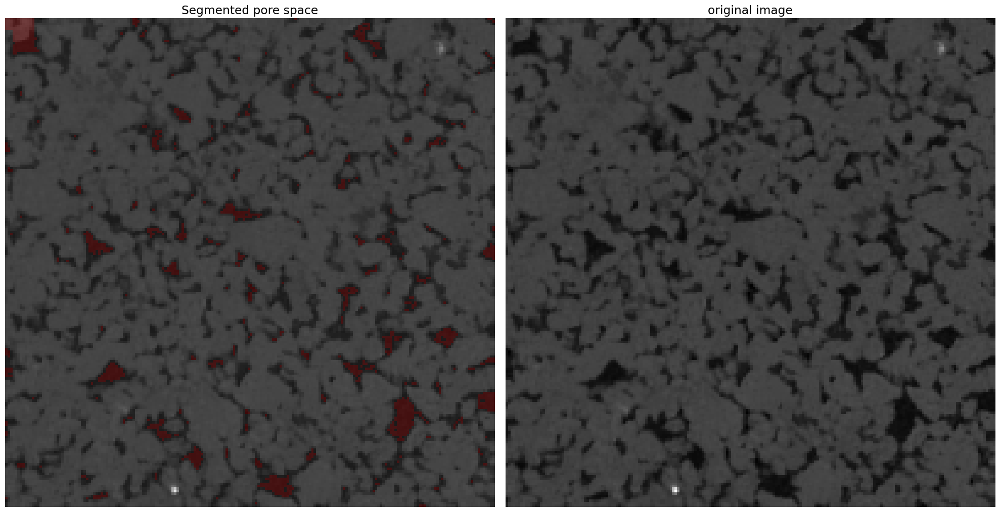

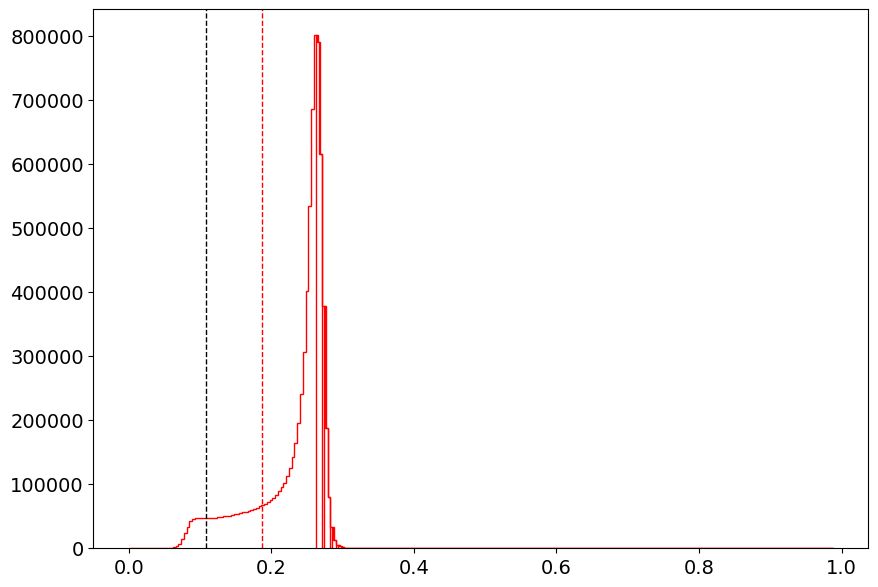

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


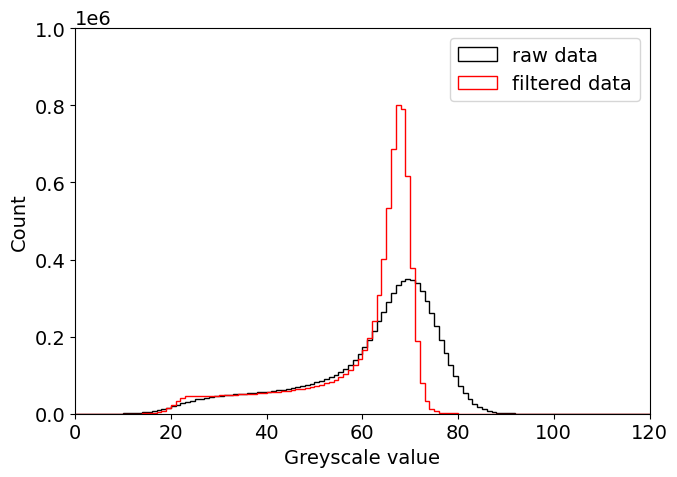

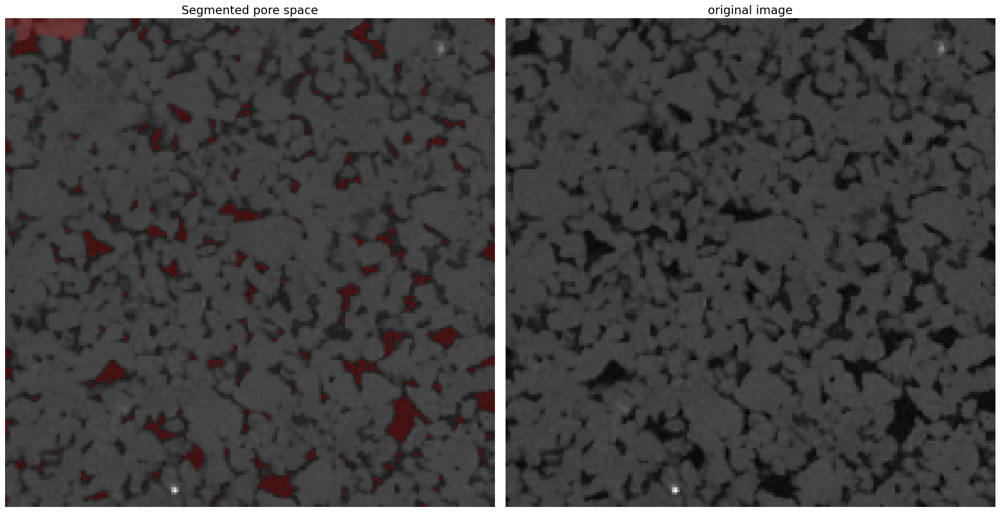

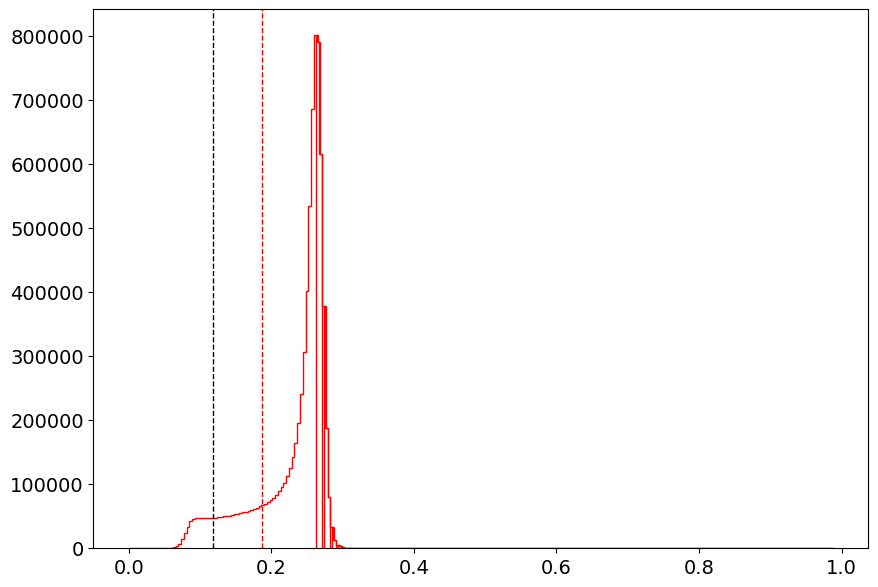

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


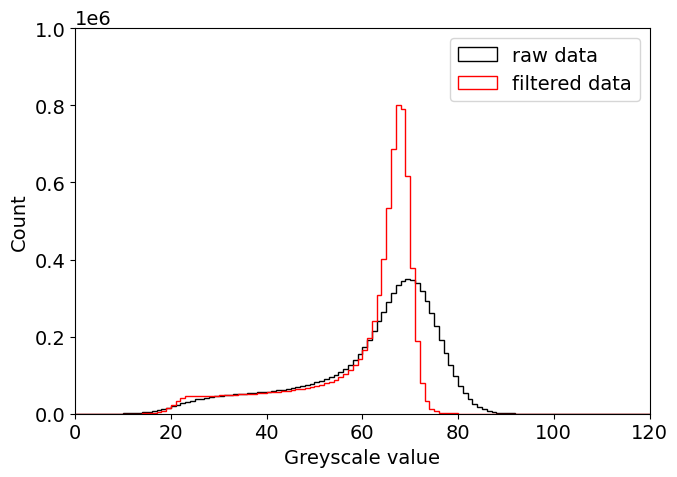

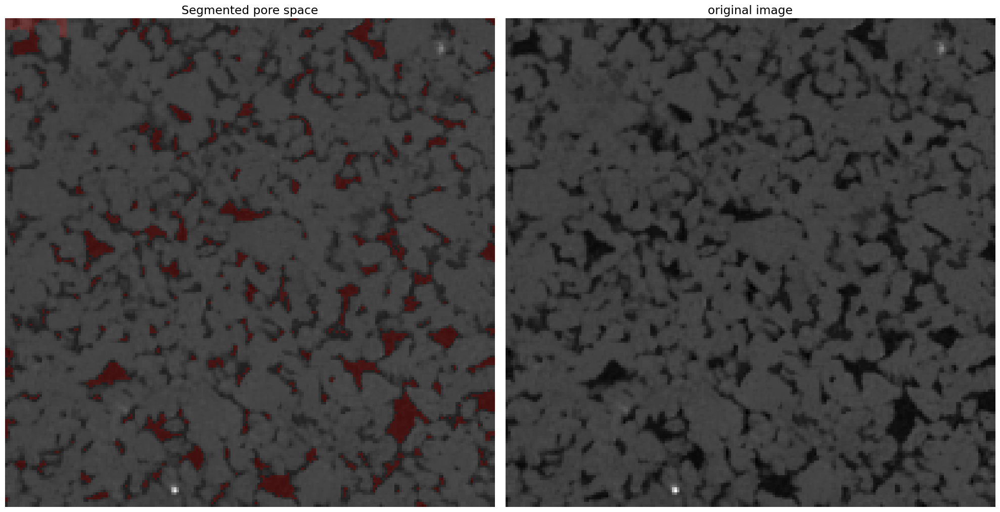

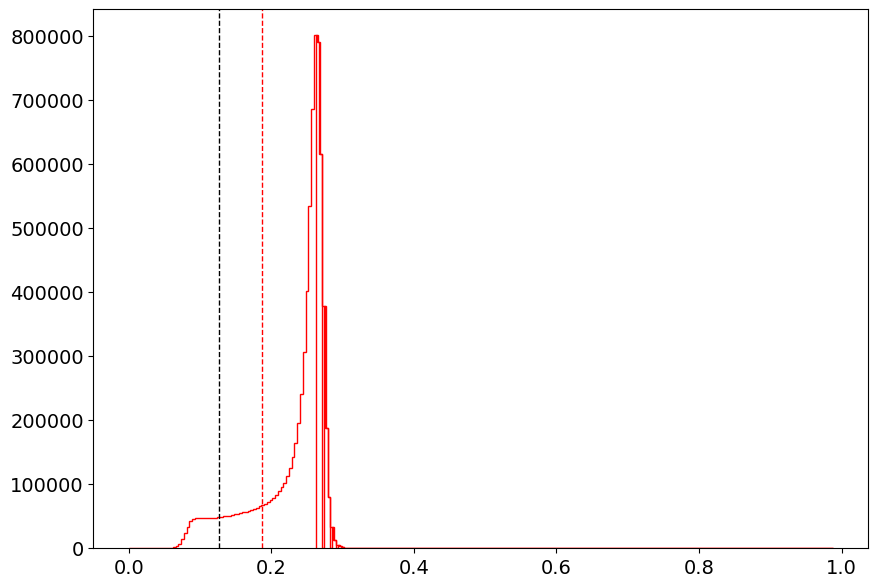

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


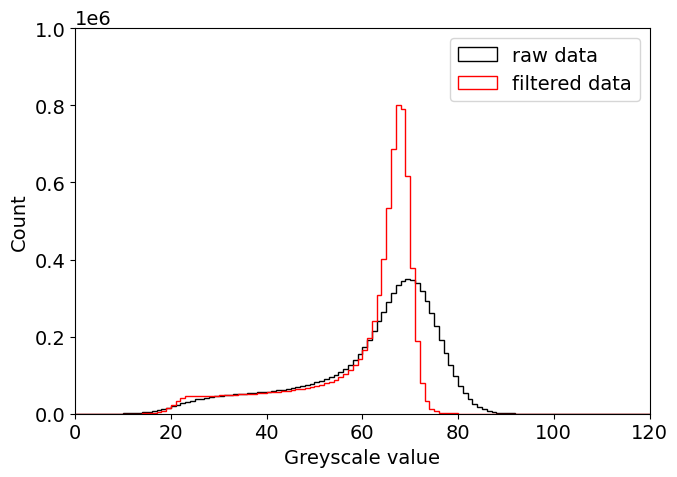

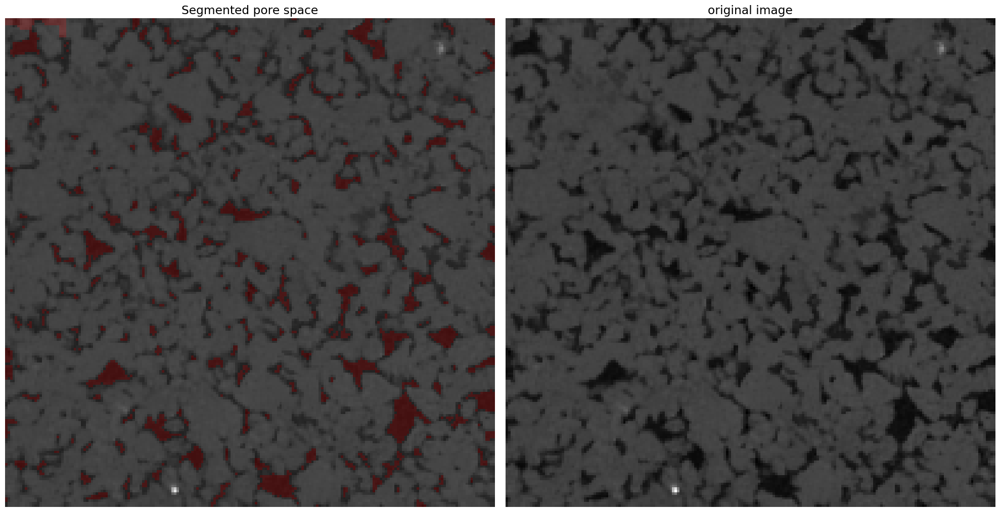

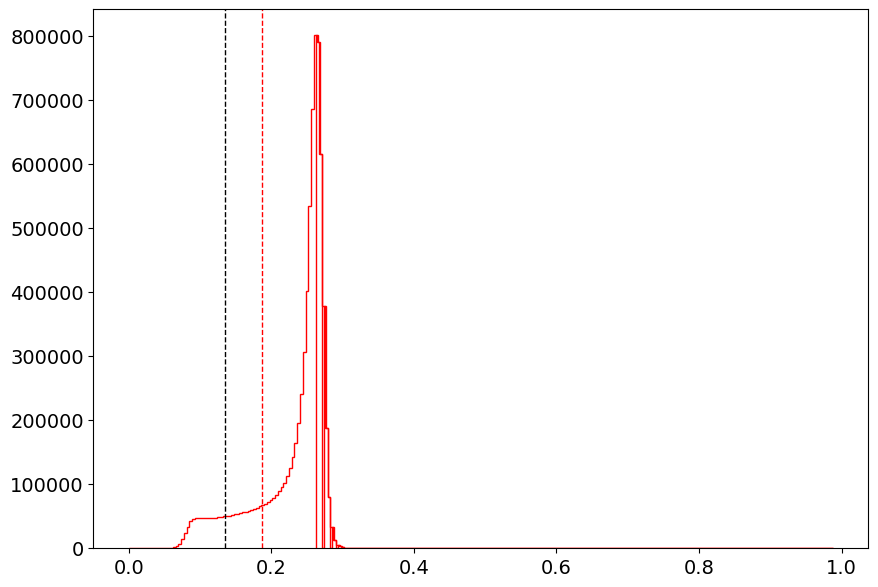

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


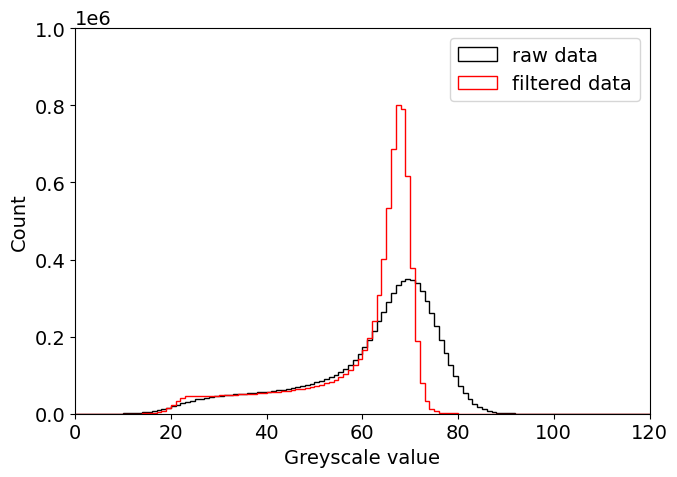

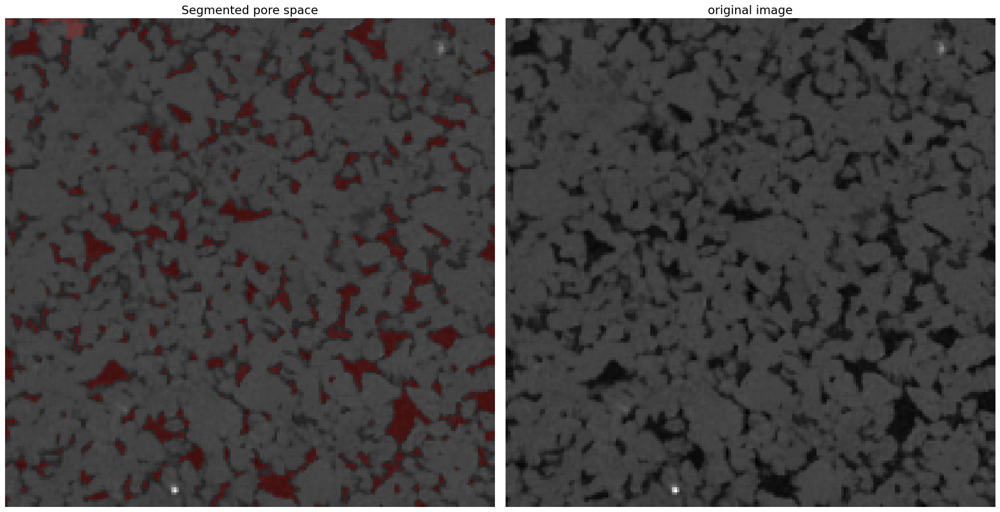

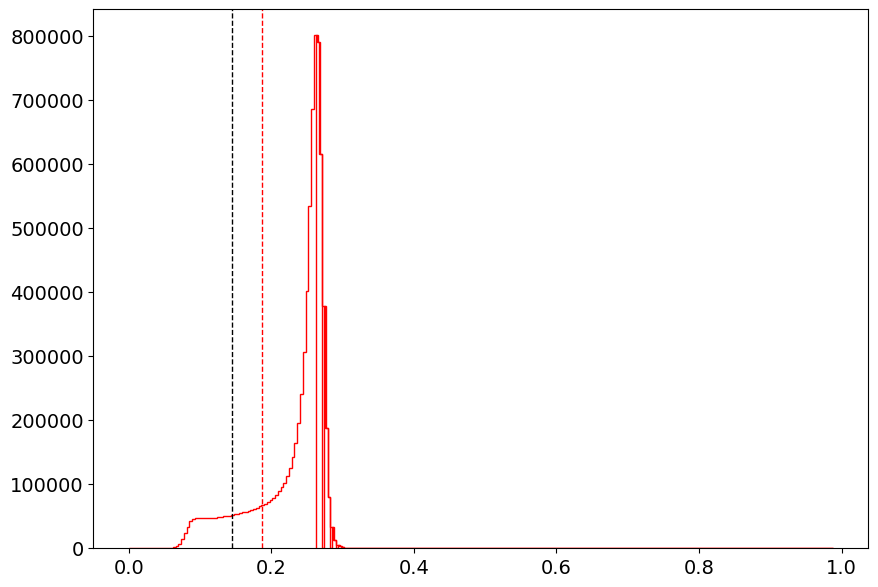

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


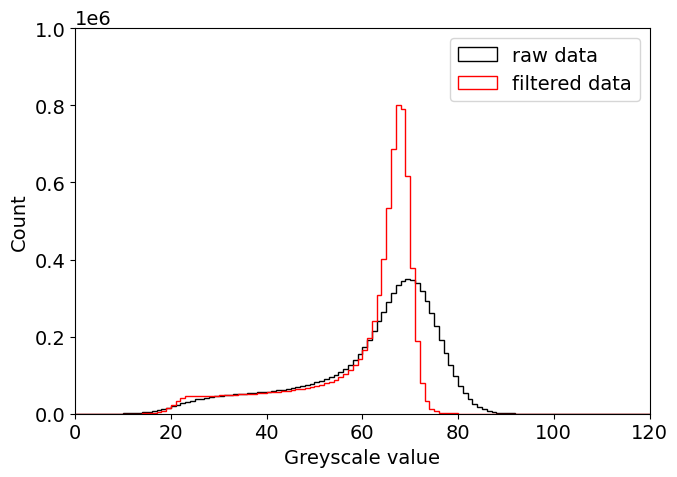

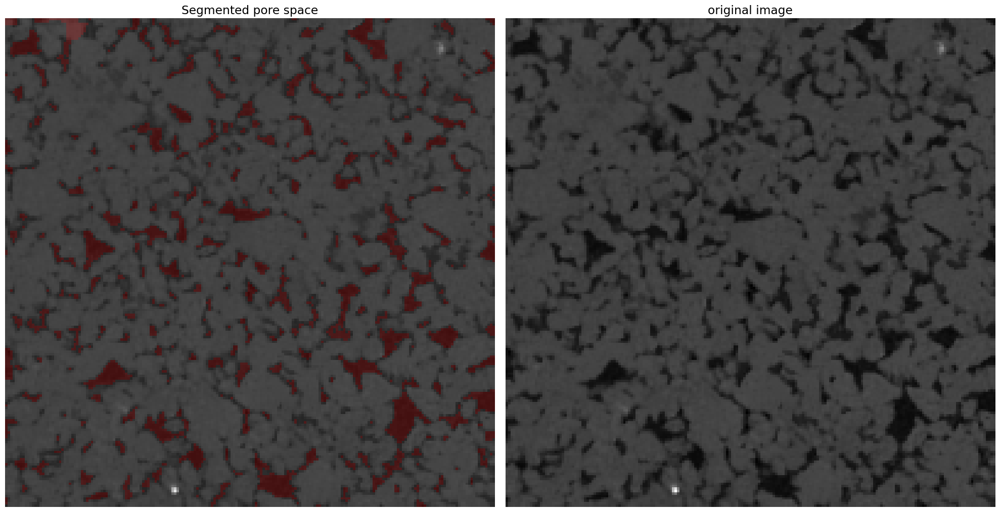

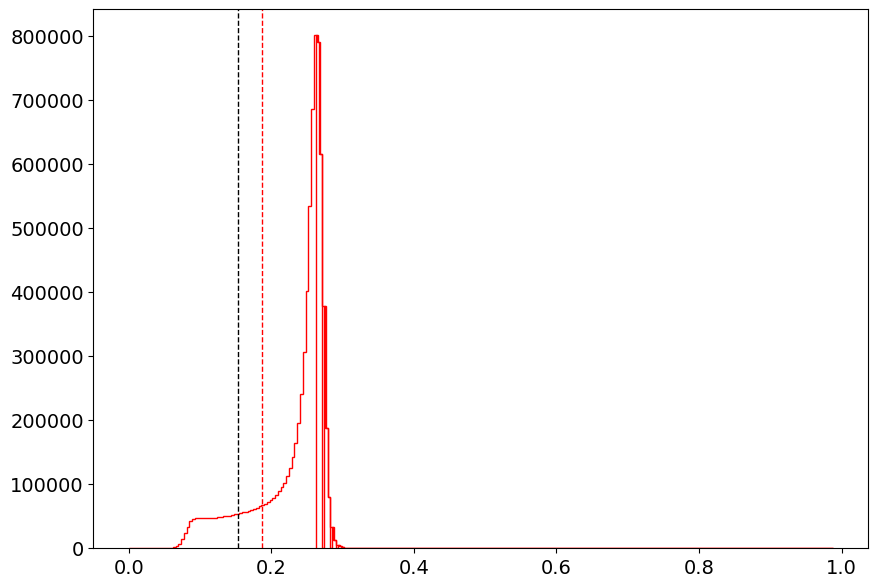

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


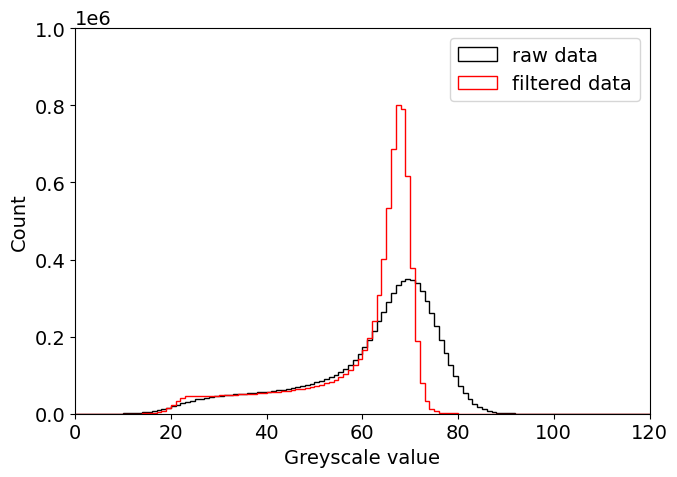

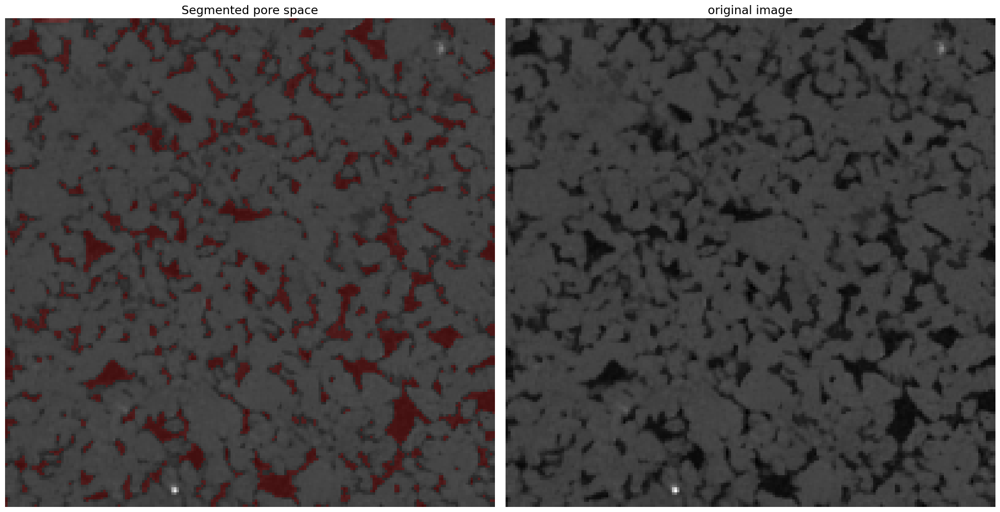

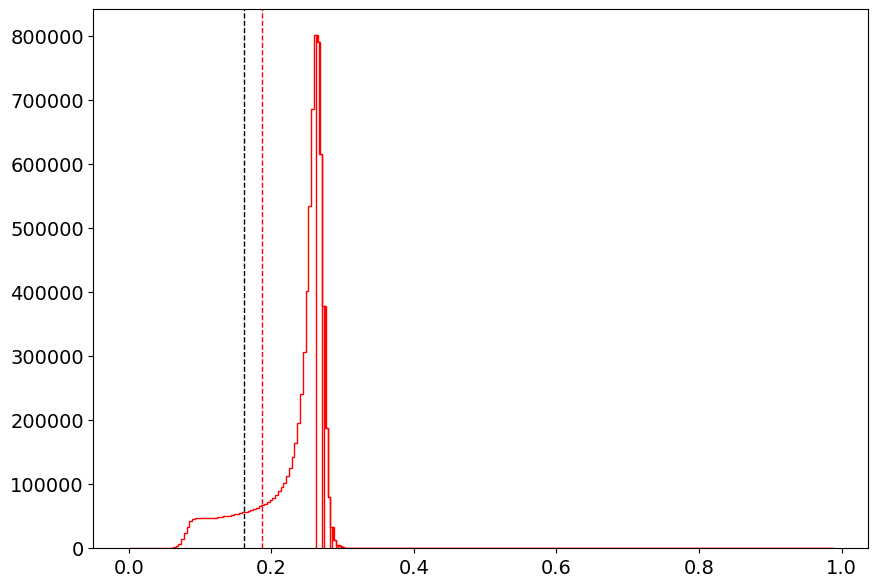

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


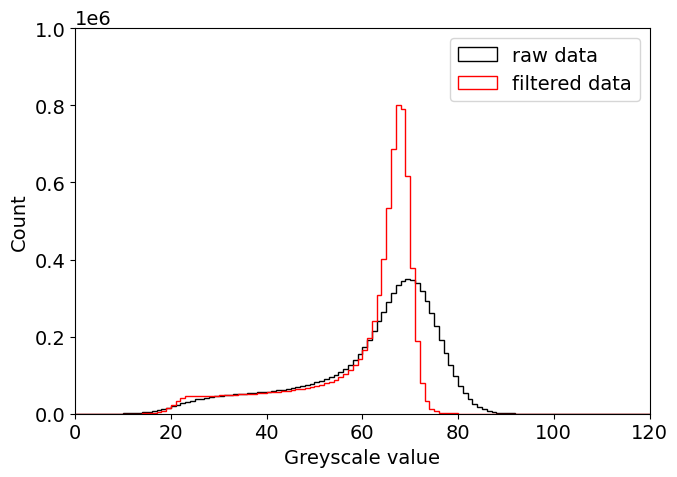

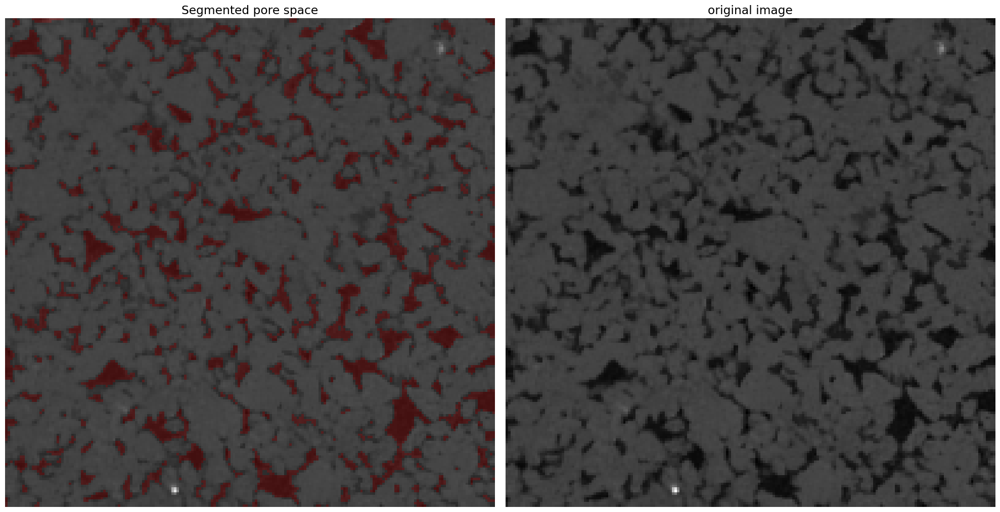

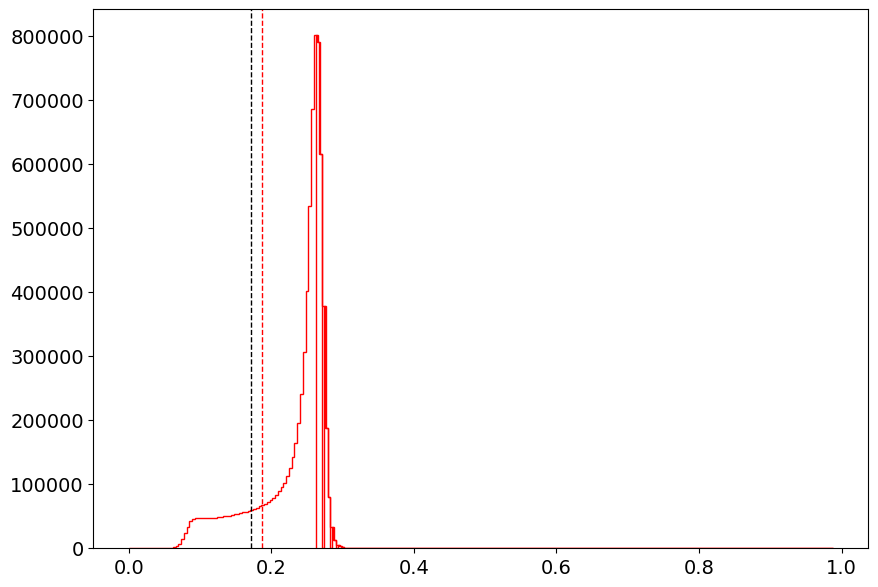

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


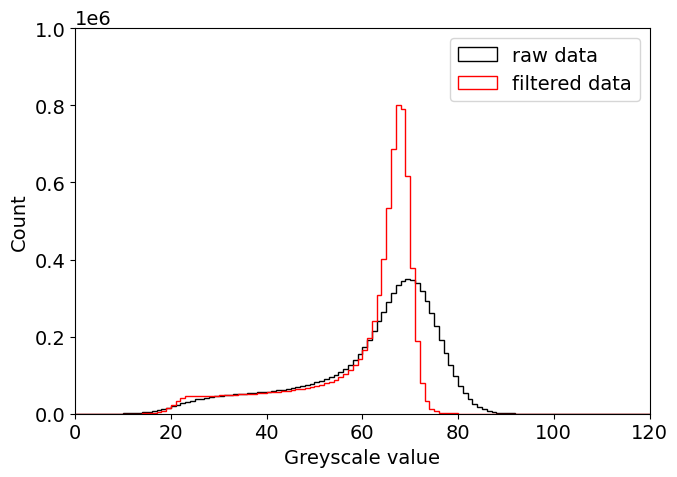

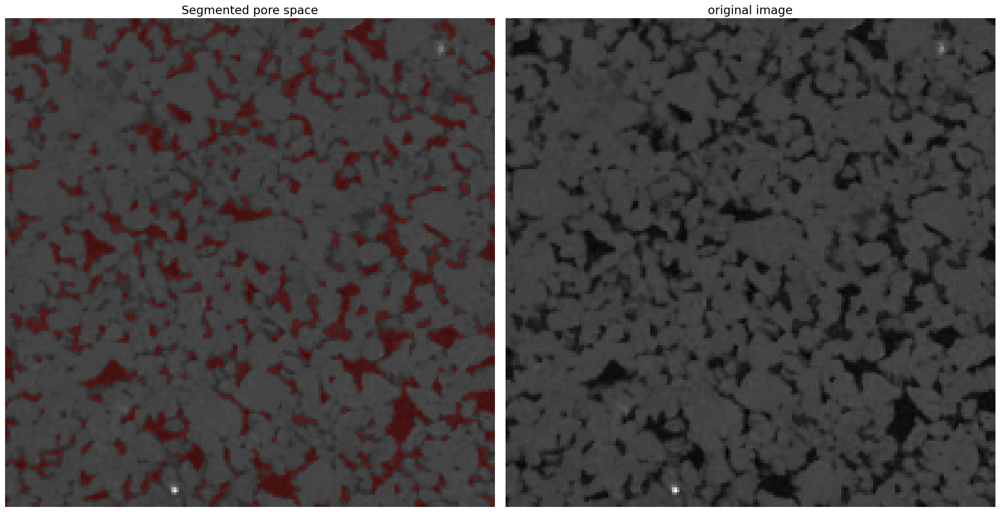

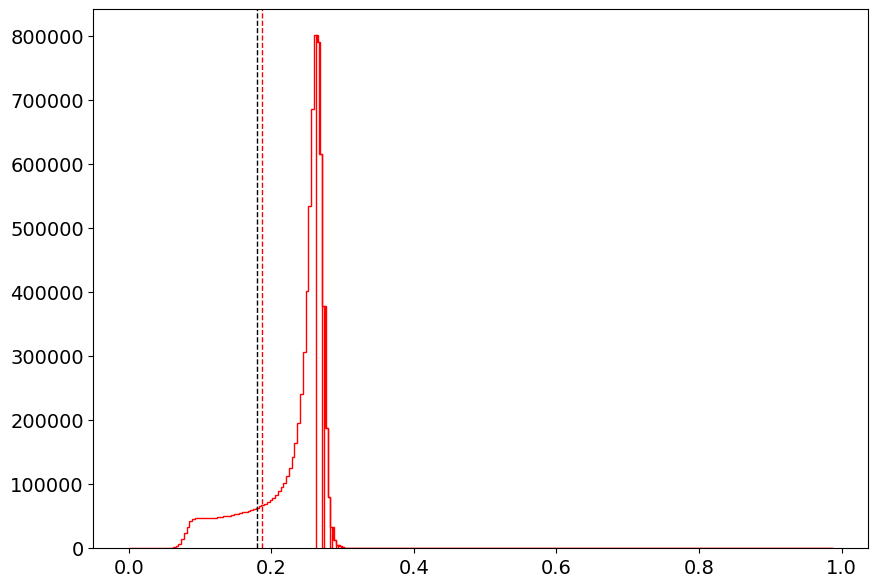

Making the catchment basin
Flood the basin
Compute the distance matrix
Find the maxima
Perform the topological watershed
Grain threshold is 0.18737716376781463


/var/folders/m_/vr37fjwj14jcz1_n2tb0js5c0000gq/T/ipykernel_35916/3148813667.py:7: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  segmented_binary             = np.where(segmented_img>0, 1, segmented_img).astype(np.bool8)


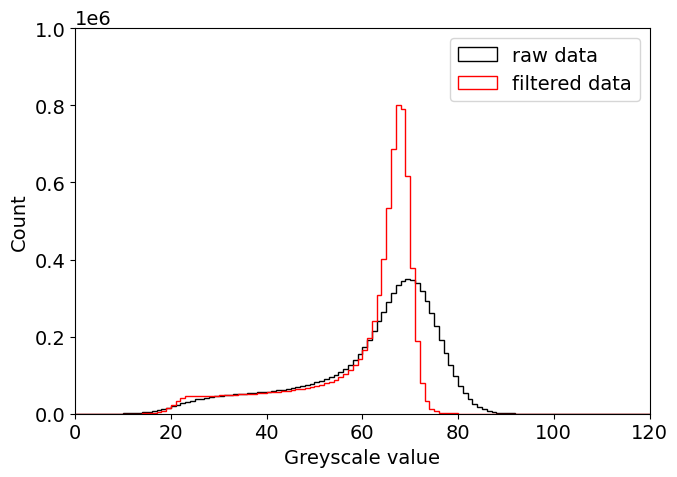

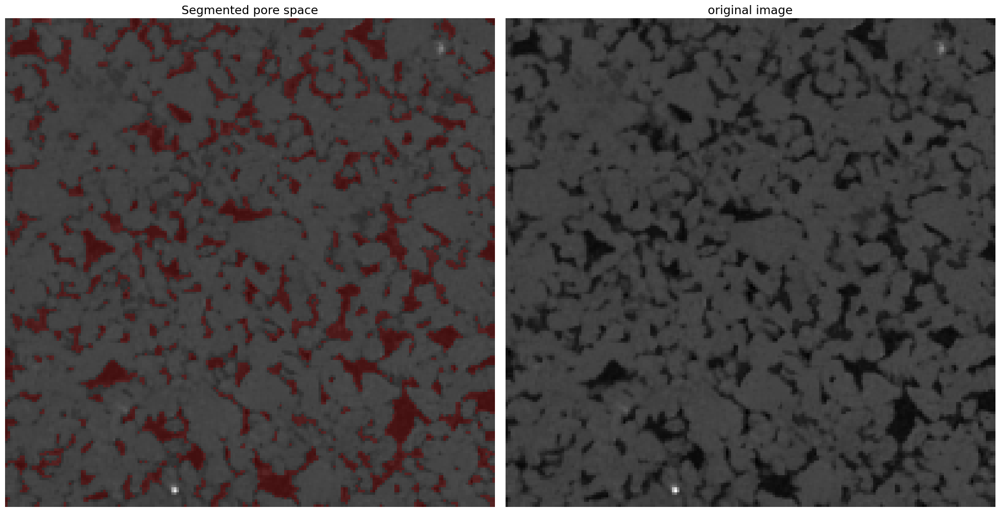

Text(0.5, 0, 'Patch size')

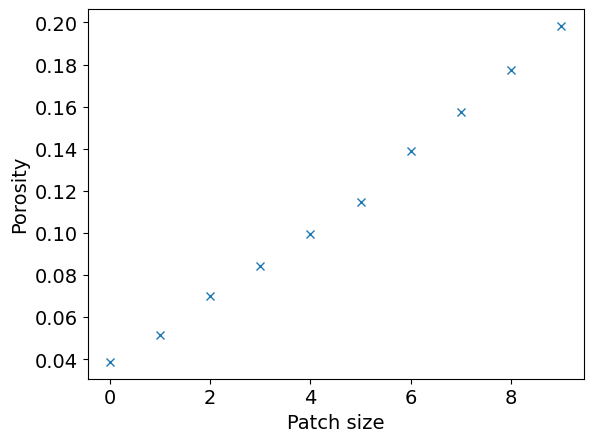

In [ ]:
phi_pore_thresh = []

for i in np.linspace(0.1, 0.18, 10):
    porosity = multiple_runs(patch = 3, dist = 6, pore_thresh=i, grain_thresh_leeway=0.9)
    phi_pore_thresh.append(porosity)

plt.plot(phi_pore_thresh, 'x')
plt.ylabel('Porosity')
plt.xlabel('Patch size')
#work out the run time for each section 

## Flow segmentation

In [58]:

def flow_segmentation(flow_scan, wet_scan, dry_scan, segmented_dry, filter):

    # convert to a 3D array and normalise so data is between 0 and 1 
    flow_scan  = np.asarray(flow_scan) 
    flow_scan = utils.preprocess(flow_scan.astype(np.float32))


    #filtering
    flow_float = flow_scan.astype(np.float32)
    del flow_scan

    denoise_flow = nlm_denoise(flow_float, patch = 3,  dist = 6)

    if filter == 'False':
        print('No filtering')
        denoise_flow = flow_float
    
    denoise_flow = utils.preprocess(denoise_flow.astype(np.uint8))

    #registration
    shift, error, diffphase = phase_cross_correlation(dry_scan[1:50,:, :], denoise_flow[1:50,:, :])
    print('Shift in Z direction for flow scan', shift)


    denoise_flow_reg = denoise_flow[(10 - int(shift[0])): wet_scan.shape[0] + 1, :, :] 
    del(denoise_flow)

    #make the arrays the same shape if the shifts are different 
    denoise_flow_reg    = denoise_flow_reg[0: wet_scan.shape[0], :, :] 
    wet_registered      = wet_scan[(10 - int(shift[0])): wet_scan.shape[0], :, :] 
    
    denoise_wet         = nlm_denoise(wet_registered.astype(np.float32), patch = 3,  dist = 6)
    
    if filter == 'False':
        denoise_wet       = wet_registered.astype(np.float32)
    

    denoise_wet         = utils.preprocess(wet_registered.astype(np.uint8))

    def simple_thresholding(img: np.array, min_threshold: float, max_threshold: float) -> np.array:
        bins=255
        # find where histogram goes to 0 for the brine 
        hist_values = img[:, :, :].ravel()
        hist_bincount = np.bincount(hist_values)
        end_brine     = np.argmax(hist_bincount<2000)

        threshold_img = ((img.max() - img.min()) * min_threshold + img.min() <= img) & (img <= (img.max() - img.min()) * max_threshold + img.min())
        threshold_img = np.array(threshold_img, dtype=np.bool_)

        assert len(threshold_img.shape) == 3  # rgb
        return threshold_img


    #subtration of the flow scan with the wet scan 
    just_gas = denoise_flow_reg - denoise_wet


    #simple thresholding segmentation 
    gas_v1         = simple_thresholding(just_gas, min_threshold=0.5, max_threshold = 0.89) #with subtraction

    filtered_gasv1 = skimage.morphology.remove_small_objects(gas_v1, min_size=4)    
    filtered_gasv1 = skimage.morphology.remove_small_holes(filtered_gasv1, area_threshold=4)    


    segmented_dry = segmented_dry[10:10 + denoise_flow_reg.shape[0], :, :]

    # Use the mask to get the location of the water 
    segmented_wet = utils.mask_with_dry(filtered_gasv1 == 1, segmented_dry)
    masked_gas    = utils.mask_with_dry(filtered_gasv1 == 0, segmented_dry)

    #Check the registration 
    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 20),
                       sharex=True, sharey=True)

    ax[0].imshow(dry_scan[22,:, :],cmap='gray')
    ax[0].axis('off')
    ax[0].set_title('Dry scan')

    ax[1].imshow(denoise_flow_reg[12,:, :],cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('Flow scan with registration')

    ax[2].imshow(denoise_flow_reg[10,:, :],cmap='gray')
    ax[2].axis('off')
    ax[2].set_title('Flow scan with no registration')

    ax[3].imshow(denoise_wet[12,:, :],cmap='gray')
    ax[3].axis('off')
    ax[3].set_title('Wet scan with registration')


    plt.show()


    widgets.interact(view_slice, img=widgets.fixed(denoise_flow_reg[:,:,:]), z=z_widget, overlay=overlay_widget, mask = widgets.fixed(filtered_gasv1[:,:,:]))

    segmented_flow = segmented_wet + (masked_gas * 2)


    return masked_gas, filtered_gasv1[:,:,:]==0


### flow segmentation without subtraction step

In [59]:
def flow_segmentation_no_subtract(flow_scan, wet_scan, dry_scan, segmented_dry, filter):

    # convert to a 3D array and normalise so data is between 0 and 1 
    flow_scan  = np.asarray(flow_scan) 
    flow_scan = utils.preprocess(flow_scan.astype(np.float32))


    #filtering
    flow_float = flow_scan.astype(np.float32)
    del flow_scan

    denoise_flow = nlm_denoise(flow_float, patch = 3,  dist = 6)

    if filter == 'False':
        print('No filtering')
        denoise_flow = flow_float
    
    denoise_flow = utils.preprocess(denoise_flow.astype(np.uint8))

    #registration
    shift, error, diffphase = phase_cross_correlation(dry_scan[1:50,:, :], denoise_flow[1:50,:, :])
    print('Shift in Z direction for flow scan', shift)


    denoise_flow_reg = denoise_flow[(10 - int(shift[0])): wet_scan.shape[0] + 1, :, :] 
    del(denoise_flow)

    #make the arrays the same shape if the shifts are different 
    denoise_flow_reg    = denoise_flow_reg[0: wet_scan.shape[0], :, :] 
    wet_registered      = wet_scan[(10 - int(shift[0])): wet_scan.shape[0], :, :] 
    
    denoise_wet         = nlm_denoise(wet_registered.astype(np.float32), patch = 3,  dist = 6)
    
    if filter == 'False':
        denoise_wet       = wet_registered.astype(np.float32)
    

    denoise_wet         = utils.preprocess(wet_registered.astype(np.uint8))

    def simple_thresholding(img: np.array, min_threshold: float, max_threshold: float) -> np.array:
        bins=255
        # find where histogram goes to 0 for the brine 
        hist_values = img[:, :, :].ravel()
        hist_bincount = np.bincount(hist_values)
        end_brine     = np.argmax(hist_bincount<2000)

        threshold_img = ((img.max() - img.min()) * min_threshold + img.min() <= img) & (img <= (img.max() - img.min()) * max_threshold + img.min())
        threshold_img = np.array(threshold_img, dtype=np.bool_)

        assert len(threshold_img.shape) == 3  # rgb
        return threshold_img


    #subtration of the flow scan with the wet scan 
    just_gas = denoise_flow_reg  


    #simple thresholding segmentation 
    gas_v1         = simple_thresholding(just_gas, min_threshold=0, max_threshold = 0.2) 

    filtered_gasv1 = skimage.morphology.remove_small_objects(gas_v1, min_size=4)    
    filtered_gasv1 = skimage.morphology.remove_small_holes(filtered_gasv1, area_threshold=4)    


    segmented_dry = segmented_dry[10:10 + denoise_flow_reg.shape[0], :, :]

    # Use the mask to get the location of the water 
    segmented_wet = utils.mask_with_dry(filtered_gasv1 == 1, segmented_dry)
    masked_gas    = utils.mask_with_dry(filtered_gasv1 == 0, segmented_dry)

    #Check the registration 
    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 20),
                       sharex=True, sharey=True)

    ax[0].imshow(dry_scan[22,:, :],cmap='gray')
    ax[0].axis('off')
    ax[0].set_title('Dry scan')

    ax[1].imshow(denoise_flow_reg[12,:, :],cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('Flow scan with registration')

    ax[2].imshow(denoise_flow_reg[10,:, :],cmap='gray')
    ax[2].axis('off')
    ax[2].set_title('Flow scan with no registration')

    ax[3].imshow(denoise_wet[12,:, :],cmap='gray')
    ax[3].axis('off')
    ax[3].set_title('Wet scan with registration')


    plt.show()

    widgets.interact(view_slice, img=widgets.fixed(denoise_flow_reg[:,:,:]), z=z_widget, overlay=overlay_widget, mask = widgets.fixed(filtered_gasv1[:,:,:]))

    segmented_flow = segmented_wet + (masked_gas * 2)
    
    return masked_gas, filtered_gasv1[:,:,:]==0


In [60]:
dry_scan  = skimage.io.imread('dry_bin2.tif')
wet_scan  = skimage.io.imread('wet_bin2.tif')
flow_scan = skimage.io.imread('flow_image.tif')
segmented_dry = segmented_binary

### Ideal segmentation + seg without masking

Shift in Z direction for flow scan [-2.  0.  0.]


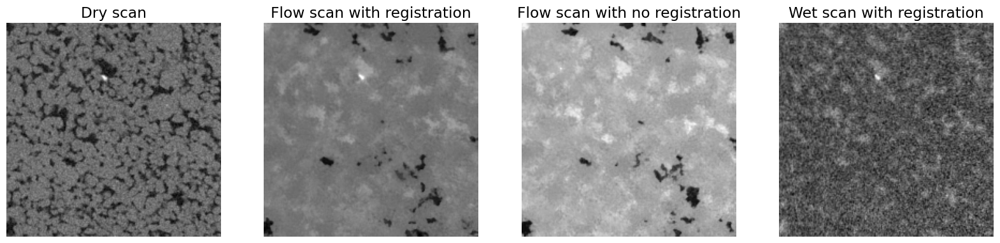

interactive(children=(IntSlider(value=117, description='z', max=199), RadioButtons(description='Overlay:', ind…

In [61]:
seg_gas_ideal, seg_ideal_no_mask = flow_segmentation(flow_scan, wet_scan, dry_scan, segmented_dry, filter = 'True')

### Without filtering 

No filtering
Shift in Z direction for flow scan [-2.  0.  0.]


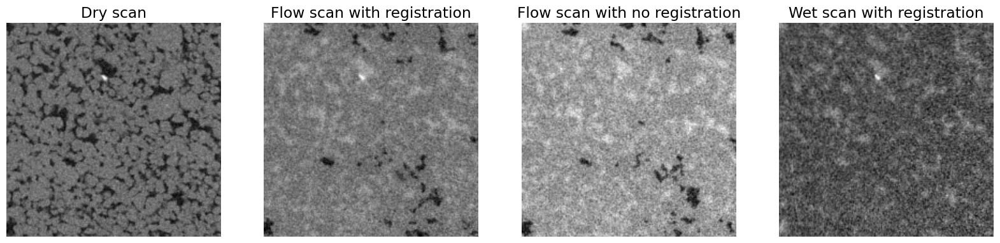

interactive(children=(IntSlider(value=117, description='z', max=199), RadioButtons(description='Overlay:', ind…

In [62]:
seg_gas_no_filter, seg_no_filter_no_mask = flow_segmentation(flow_scan, wet_scan, dry_scan, segmented_dry, filter = 'False')

### Without the subtraction step 

Shift in Z direction for flow scan [-2.  0.  0.]


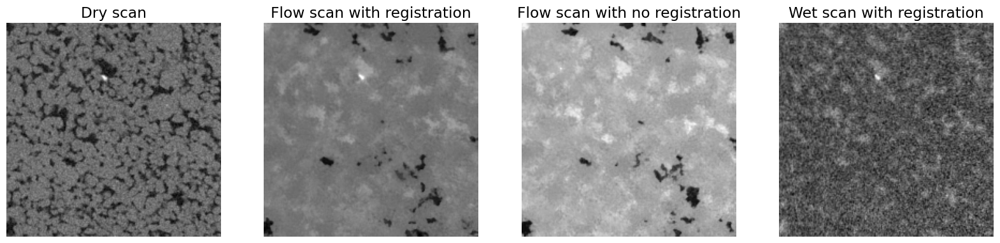

interactive(children=(IntSlider(value=117, description='z', max=199), RadioButtons(description='Overlay:', ind…

In [63]:
seg_gas_no_subtract, seg_no_subtract_no_mask = flow_segmentation_no_subtract(flow_scan, wet_scan, dry_scan, segmented_dry, filter = 'True')

## Sensitivity analysis for flow images

In [64]:

dataset_seg = [
seg_gas_ideal,
seg_ideal_no_mask,

seg_gas_no_filter,
seg_no_filter_no_mask,

seg_gas_no_subtract,
seg_no_subtract_no_mask]

316


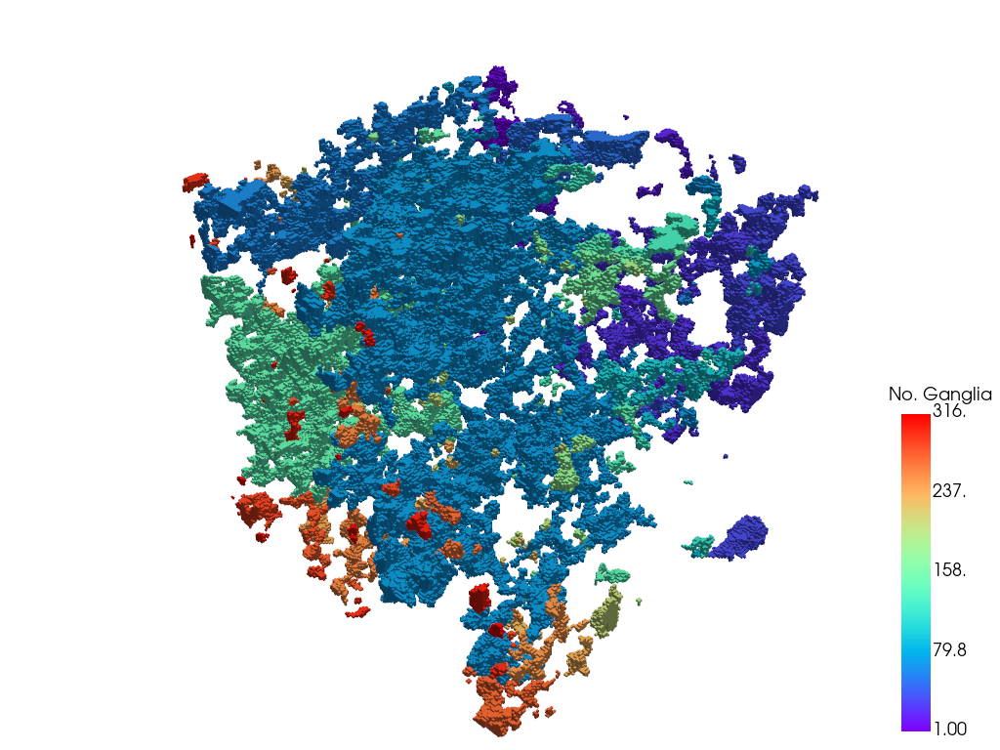

185


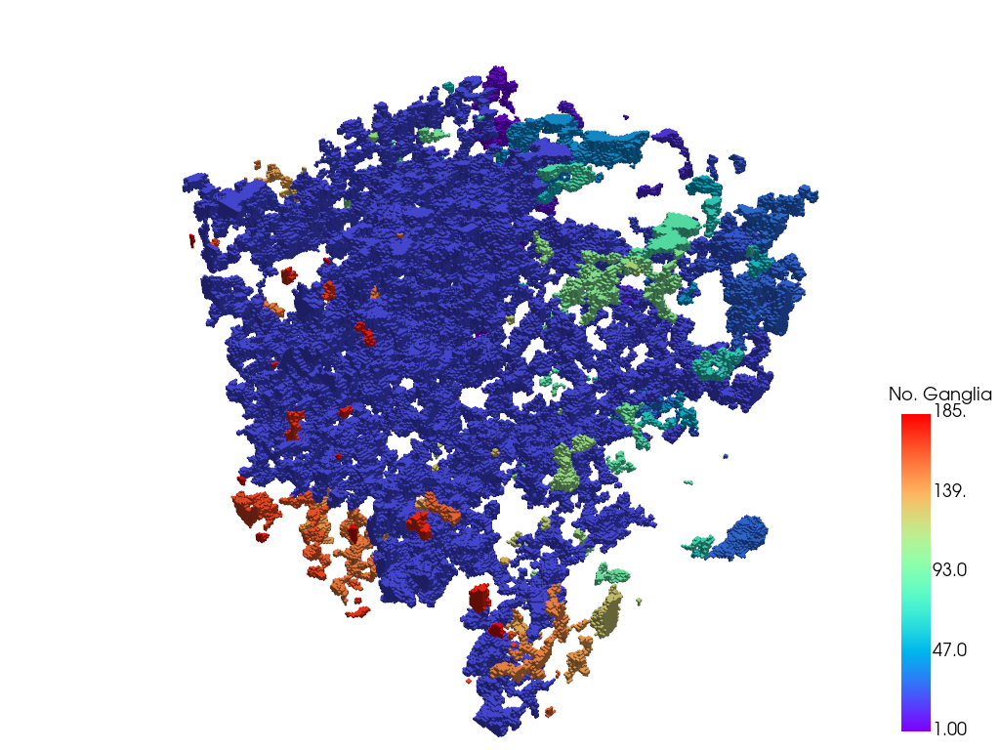

303


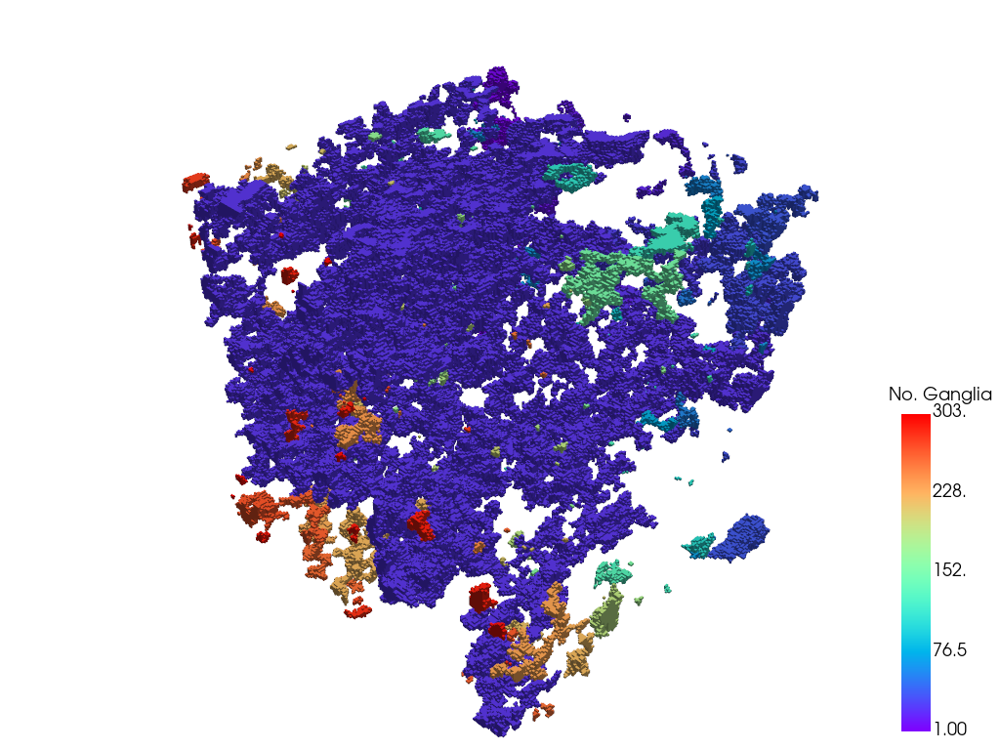

162


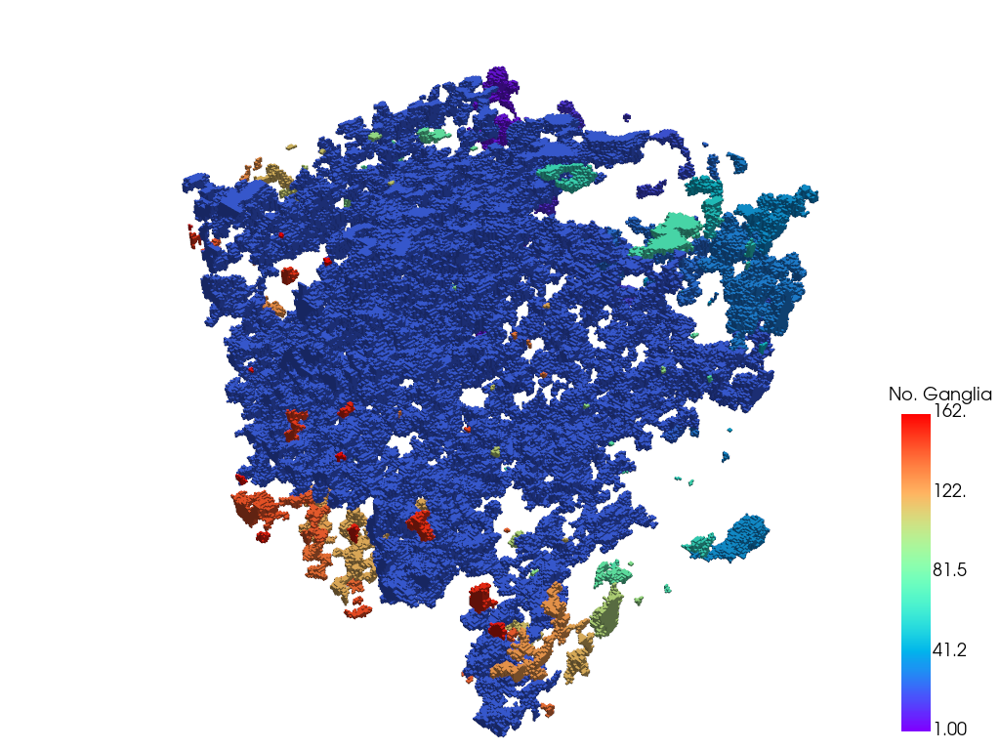

225


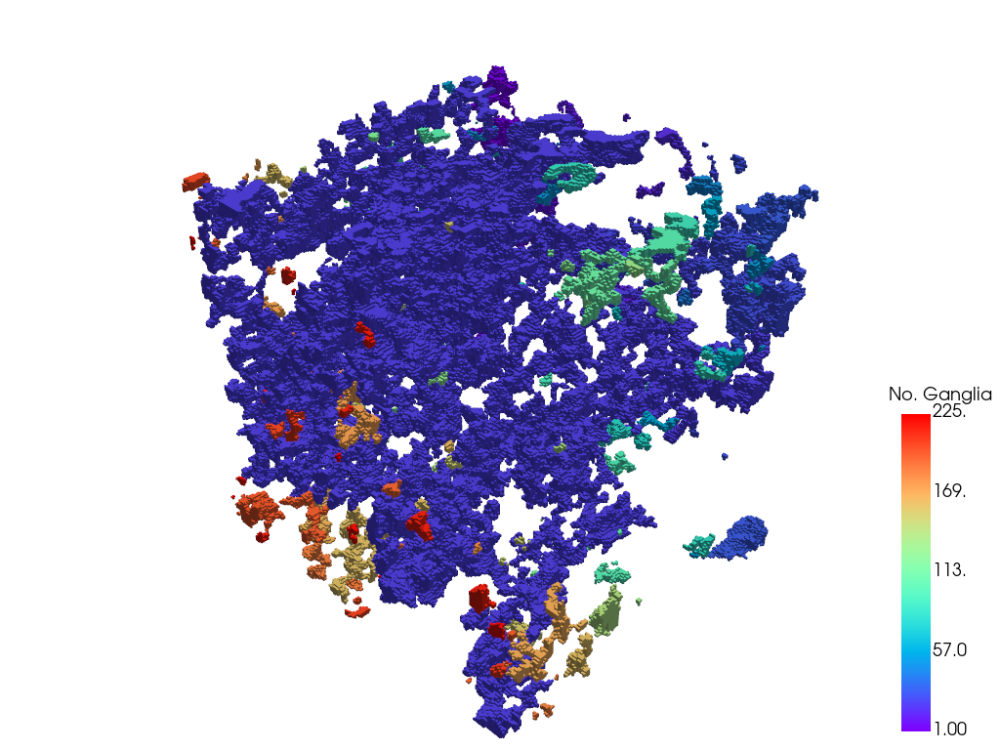

122


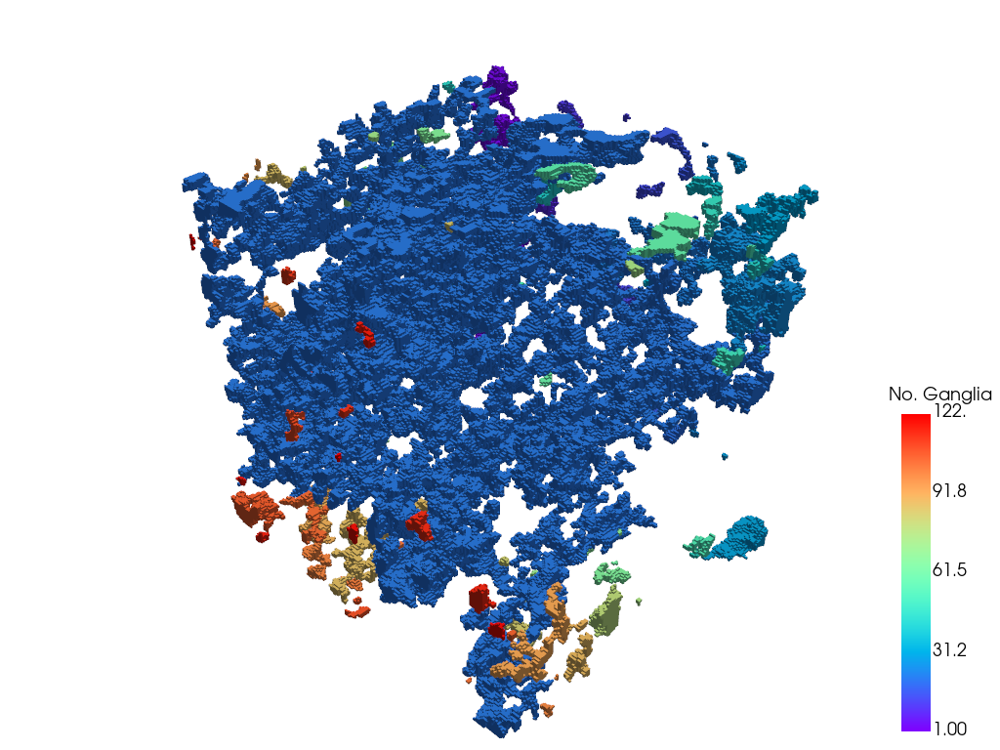

929


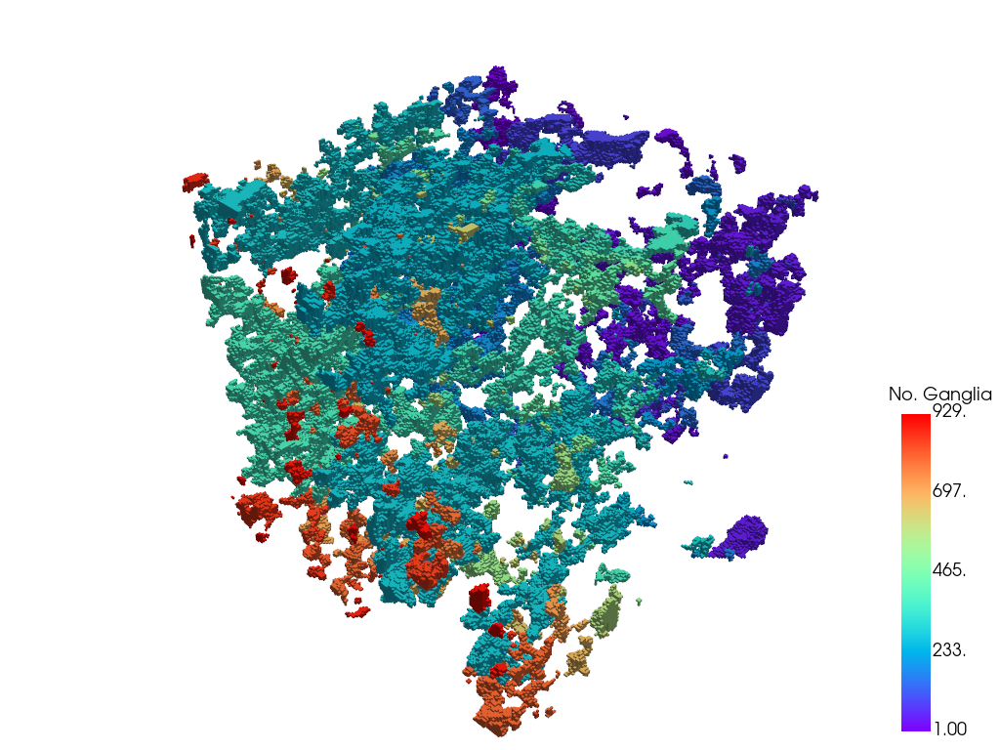

296


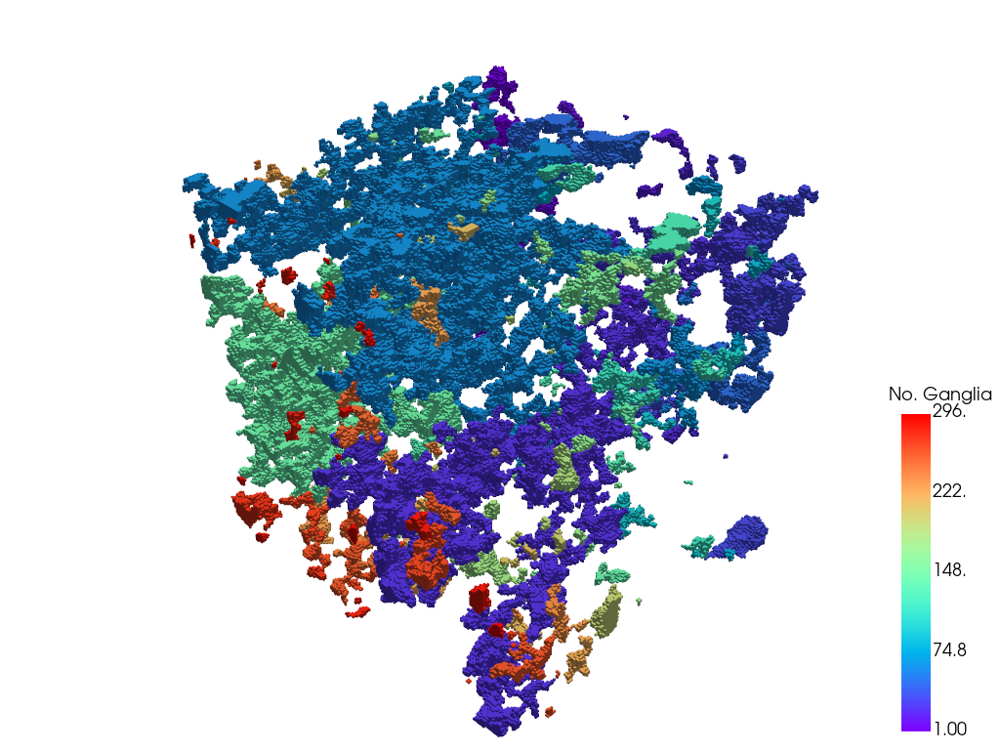

989


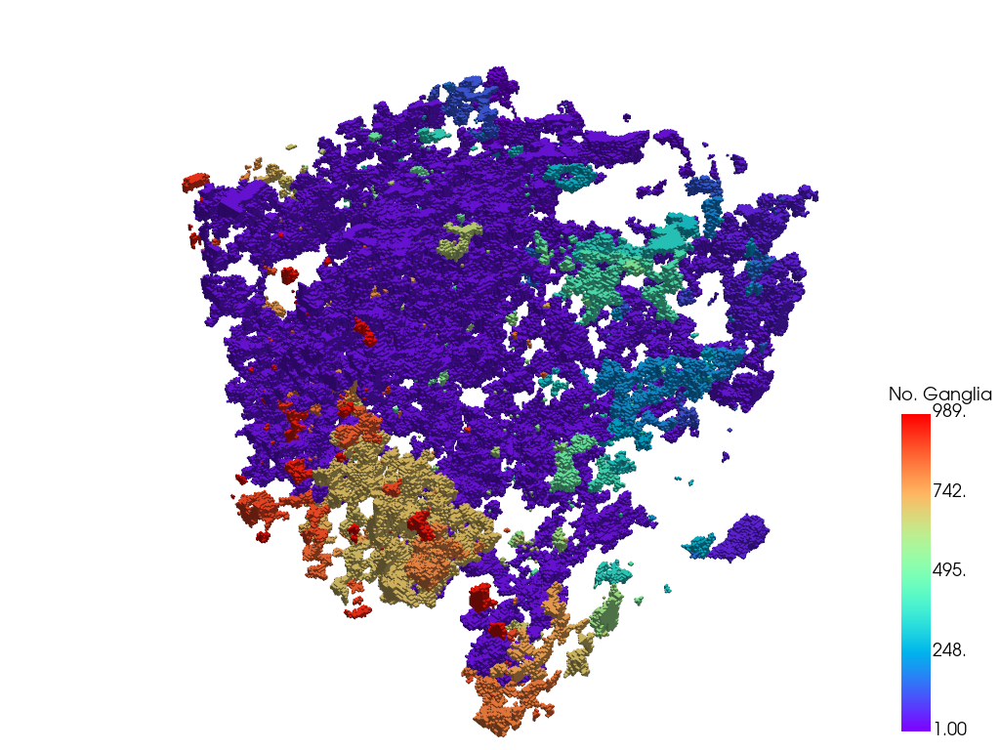

214


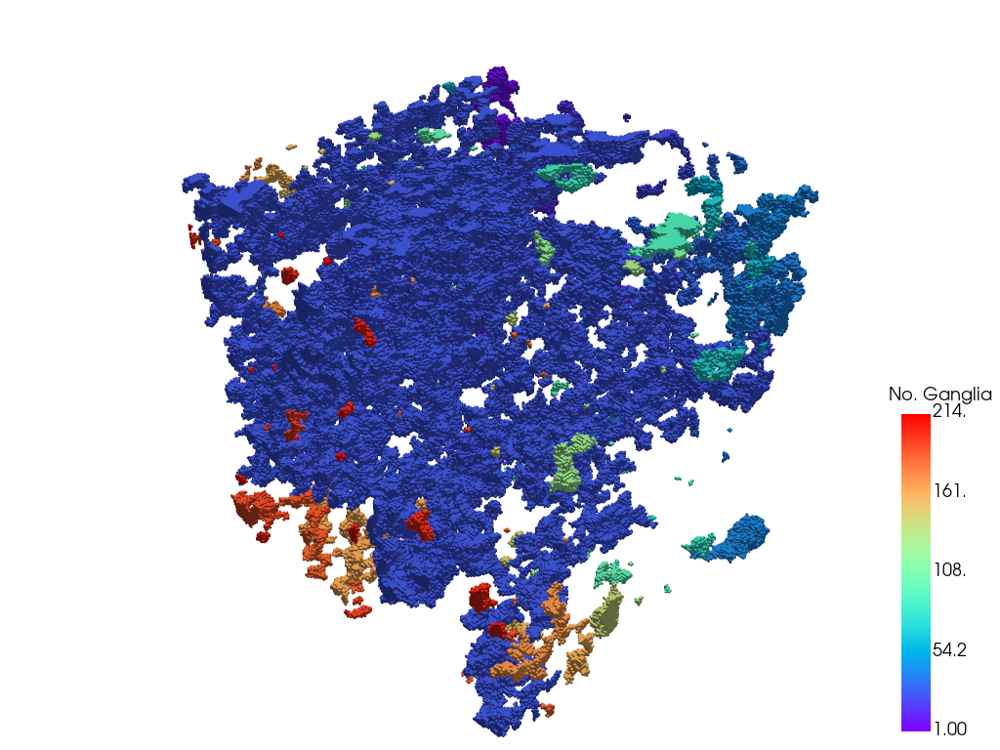

629


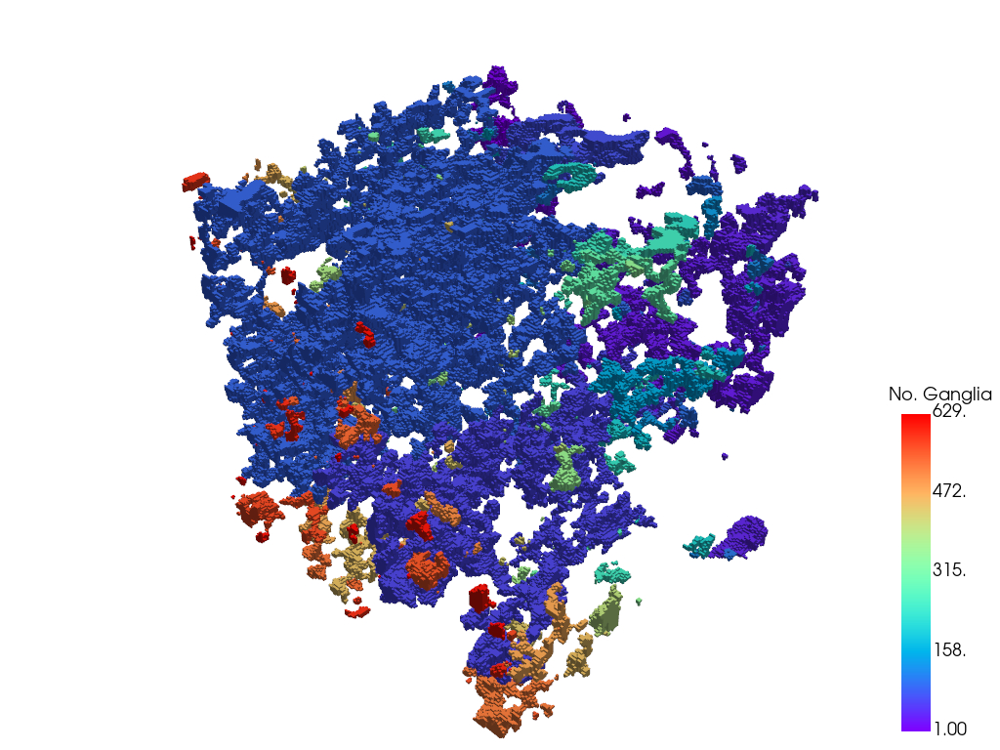

145


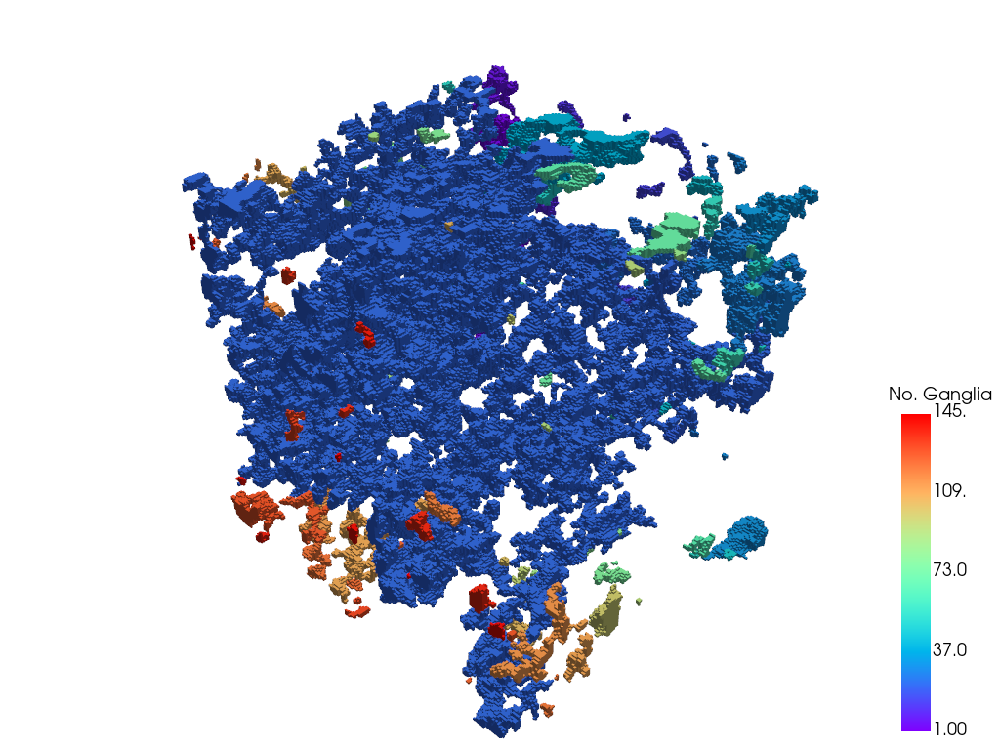

In [65]:


num_ganglia_connect3 = [seg_analysis(item, connect_value=3) for item in dataset_seg]
num_ganglia_connect1 = [seg_analysis(item, connect_value=1) for item in dataset_seg]


#### Number of ganglia 

Num ganglia [316, 185, 303, 162, 225, 122]


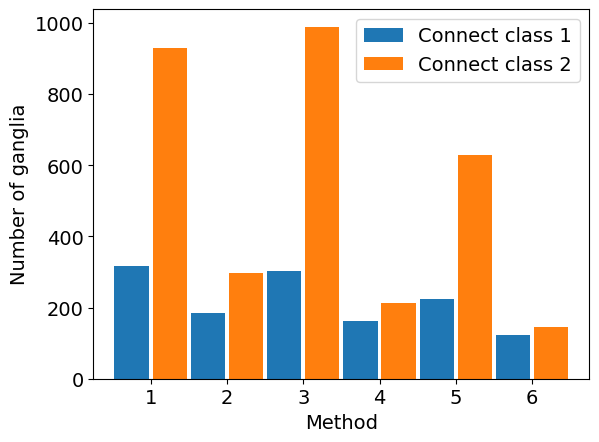

In [66]:

print('Num ganglia', num_ganglia_connect3)

plt.bar(range(1,13,2),num_ganglia_connect3, width=0.9, label='Connect class 1')
plt.bar(range(2,14,2),num_ganglia_connect1, width=0.9, label='Connect class 2')

plt.ylabel('Number of ganglia')
plt.xlabel('Method')

# Set x-ticks between the bars, at 1.5, 3.5, 5.5, etc.
ticks = [(x + y) / 2 for x, y in zip(range(1, 13, 2), range(2, 14, 2))]
plt.xticks(ticks, ['1', '2', '3', '4', '5', '6'])  # Customize the labels accordingly

plt.xlim(0,13)
plt.legend()
plt.show()



#### Volume

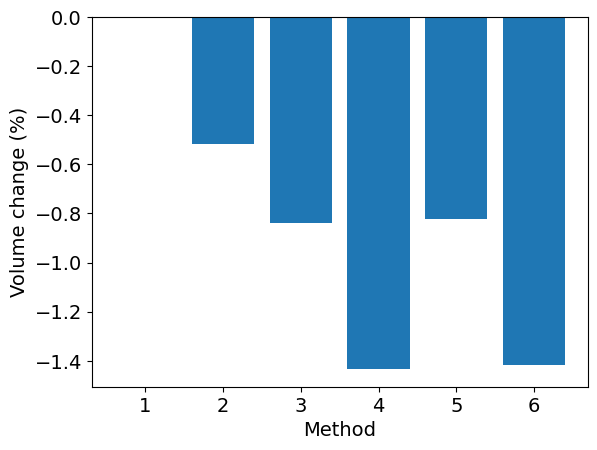

In [67]:
volume = [np.sum(item==1) for item in dataset_seg]
volume = 100* (volume - volume[0])/ volume[0] #normalize 

plt.bar(range(1,7),volume)
plt.ylabel('Volume change (%)')
plt.xlabel('Method')
plt.show()

#### Surface area 

In [68]:
def surface_area_calculation(data, smoothing):
    #to calculate the surface area, we first need to create a surface mesh
    if smoothing == 'None':
        verts, faces, normals, values = skimage.measure.marching_cubes(data, level = None)
    else: 
        verts, faces, normals, values = skimage.measure.marching_cubes(data, level = smoothing)
    
    #from the mesh, we can calculate the surface area 
    surface_area = skimage.measure.mesh_surface_area(verts, faces)
    print('The surface area is {:.2f} voxels\u00B2'.format(surface_area))
    return surface_area

#NB, the surface area will be dependent on the smoothing chosen 
# level float, optional: Contour value to search for isosurfaces in volume. If not given or None, the average of the min and max of vol is used.
#surface_area_1 = surface_area_calculation(data, 'None')
#surface_area_2 = surface_area_calculation(data, 0)  #'blockiest' case

#print('Smoothing can havilty influence the surface area calculated. In this case, the variation was {:.2f} %'.format(100*(surface_area_2- surface_area_1) / (0.5*(surface_area_2 + surface_area_1))))
    
surface_area = [surface_area_calculation(item, 'None') for item in dataset_seg]


The surface area is 399002.12 voxels²
The surface area is 397135.38 voxels²
The surface area is 472360.47 voxels²
The surface area is 471582.12 voxels²
The surface area is 423405.22 voxels²
The surface area is 416899.81 voxels²


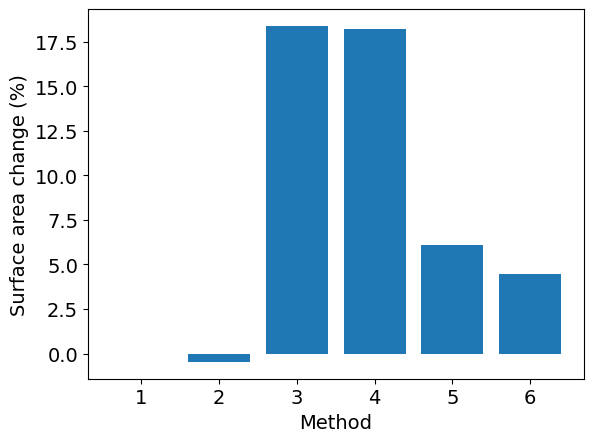

In [69]:
surface_area = 100* (surface_area - surface_area[0])/ surface_area[0] #normalize 

plt.bar(range(1,7),surface_area)
plt.ylabel('Surface area change (%)')
plt.xlabel('Method')
plt.show()

#### Euler number 

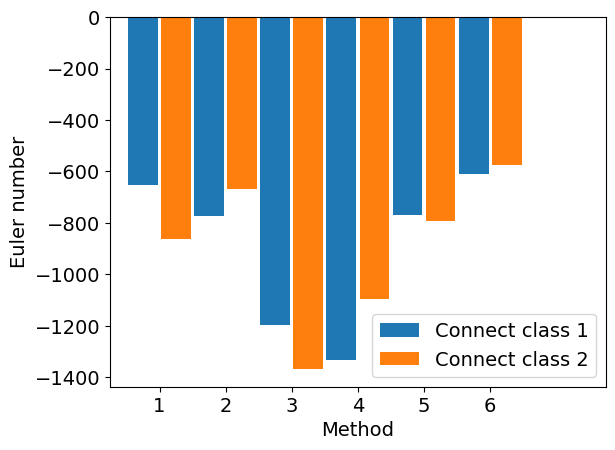

In [70]:

euler_connect3  = [skimage.measure.euler_number(item, connectivity = 3) for item in dataset_seg]
euler_connect1  = [skimage.measure.euler_number(item, connectivity = 1) for item in dataset_seg]



plt.bar(range(1, 13, 2), euler_connect3, width=0.9, label='Connect class 1')
plt.bar(range(2, 14, 2), euler_connect1, width=0.9, label='Connect class 2')

# Add labels and ticks
plt.ylabel('Euler number')
plt.xlabel('Method')

# Set x-ticks between the bars, at 1.5, 3.5, 5.5, etc.
ticks = [(x + y) / 2 for x, y in zip(range(1, 13, 2), range(2, 14, 2))]
plt.xticks(ticks, ['1', '2', '3', '4', '5', '6'])  # Customize the labels accordingly

plt.xlim(0,15)
plt.legend()
plt.show()


